# Выпускная квалификационная работа по курсу "DATA Science PRO"

## Тема: Прогнозирование конечных свойств новых материалов (композиционных материалов). 

### Цель работы: постороить модели для прогноза модуля упругости при растяжении, прочности при растяжении и соотношение матрица-наполнитель.

### Итог работы: Написать приложение, которое будет выдавать прогноз, полученный при обученной модели машинного обучения "соотношение-матрица наполнитель" 

## Задача
### Обучить алгоритм машинного обучения, который будет определять значения:
### Модуль упругости при растяжении, ГПа; Прочность при растяжении, МПа.
#### Для этого нам нужно обработать данные, удалить выбросы и нормализовать датасет

### 1. Изучить теоретические основы и методы решения поставленной задачи.

#### Для решения данной задачи необходимо учитывать следующие теоретические основы и методы:
- Разведочный анализ данных для изучения их структуры и распределения
переменных.
- Предобработка данных, включающая удаление шумов, заполнение пропущенных значений и нормализацию переменных.
- Обучение моделей для прогнозирования нужных характеристик с
использованием различных методов, таких как линейная регрессия, случайный лес, 
градиентный бустинг и т.д.
- Оценка качества моделей с помощью метрик, таких как среднеквадратичная ошибка (MSE), коэффициент детерминации (R^2) и других.
- Оптимизация гиперпараметров моделей с использованием поиска по сетке и перекрестной проверки.

### 2. Для проведения разведочного анализа данных и получения статистических характеристик можно использовать библиотеки pandas, matplotlib и seaborn. Ниже приведен пример кода для реализации этого пункта:

In [1]:
# Импортируем нужные библиотеки
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
import numpy as np 
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

C:\Users\Rick\AppData\Local\Temp\ipykernel_2236\3833499671.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
# Загружаем датасеты каждый под свою переменную для легкости объединенния 
X_bp=pd.read_csv('D:/my/МГТУ/diplom/X_bp.csv')
X_nup=pd.read_csv('D:/my/МГТУ/diplom/X_nup.csv')

# Смотрим на кол-во строк и столбцов
print(X_bp.shape)
print(X_nup.shape)

(1023, 10)
(1040, 3)


In [3]:
print(X_bp.info())
print('------')
print(X_nup.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1023 entries, 0 to 1022
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 80.1 KB
None
------
<class 'pandas.core.frame.DataFrame

In [4]:
# Взглянем на 5 строк данных файла X_bp.csv
X_bp.head(6)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [5]:
# Взглянем на 5 строк данных файла X_nup.csv
X_nup.head(6)

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.0,4.0,57.0
1,0.0,4.0,60.0
2,0.0,4.0,70.0
3,0.0,5.0,47.0
4,0.0,5.0,57.0
5,0.0,5.0,60.0


In [6]:
print(X_bp.nunique())
print('-------')
print(X_nup.nunique())

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
dtype: int64
-------
Угол нашивки, град       2
Шаг нашивки           1006
Плотность нашивки     1005
dtype: int64


In [7]:
# Объединение делаем по индексу, тип объединения — INNER. 
dfall=X_bp.merge(X_nup, left_index=True, right_index=True, how='inner')

# Смотрим данные после объединения
dfall.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [8]:
# смотрим на то, как объеденился датасет, а также увидим кол-во строк и столбцов
dfall

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


In [9]:
# Посмотрим на уникальные значения в датасете
dfall.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [10]:
# Очень странно что кол-во всех уникальных значений практически похоже, 
#### а вот угол нашивки выбивается из этого списка. 
# Посмотрим на него
print('Уникальные значения "угол нашивки":',dfall['Угол нашивки, град'].nunique())

# Узнаем где угол нашивки равен 0 
print('"угол нашивки" = 0:', dfall['Угол нашивки, град'][dfall['Угол нашивки, град'] == 0.0].count())

Уникальные значения "угол нашивки": 2
"угол нашивки" = 0: 520


In [11]:
# Поменяем значения в столбцов "угол нашивки" с 0.0 на 0 с 90.0 на 1
dfall = dfall.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
dfall['Угол нашивки, град'] = dfall['Угол нашивки, град'].astype(int)

# Посмотрим на значения "угол нашивки"
print('Посмотрим на значения "угол нашивки":', dfall['Угол нашивки, град'].tolist)

Посмотрим на значения "угол нашивки": <bound method IndexOpsMixin.tolist of 0       0
1       0
2       0
3       0
4       0
       ..
1018    1
1019    1
1020    1
1021    1
1022    1
Name: Угол нашивки, град, Length: 1023, dtype: int32>


In [12]:
# Изучим данные
dfall.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64
--------
Дубликаты в датасете: 0


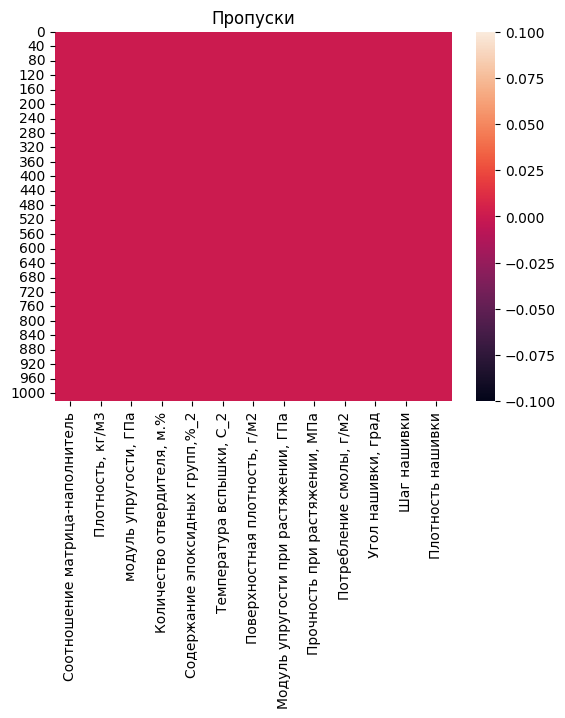

In [13]:
# Узнаем есть ли пропущенные значения с помощью .isnull().sum()
print(dfall.isnull().sum())
# Отлично, пропусков нет, но сделаем визуализацию

# Визуализация датасета на пропуски
col=dfall.columns
sns.heatmap(dfall[col].isnull())
plt.title('Пропуски')

print('--------')  

# Как видим пропусков нет, но нужно проверить если у нас дубликаты в датасете
print('Дубликаты в датасете:', dfall.duplicated().sum())

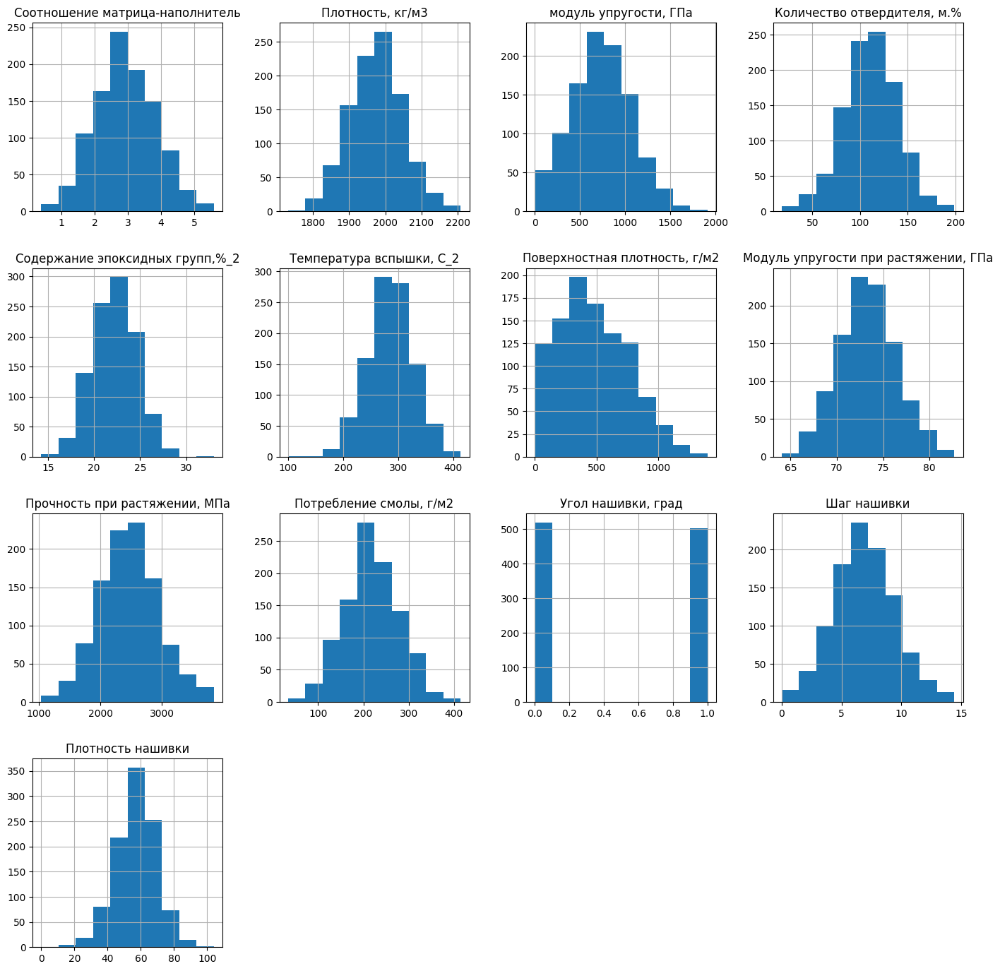

In [14]:
# Гистограмма распределения каждой переменной
dfall.hist(figsize=(17,17))
plt.show()

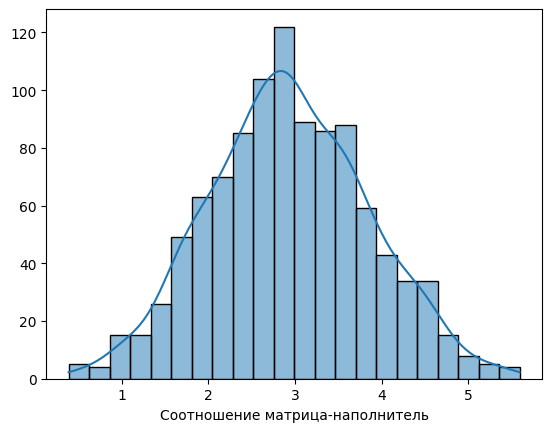

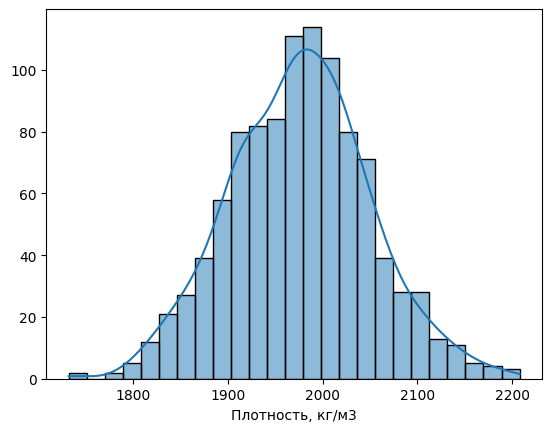

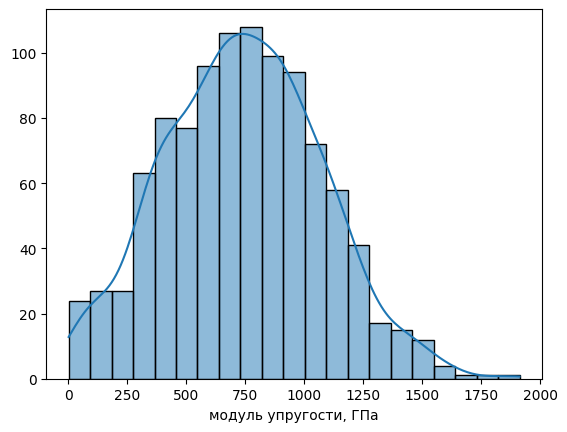

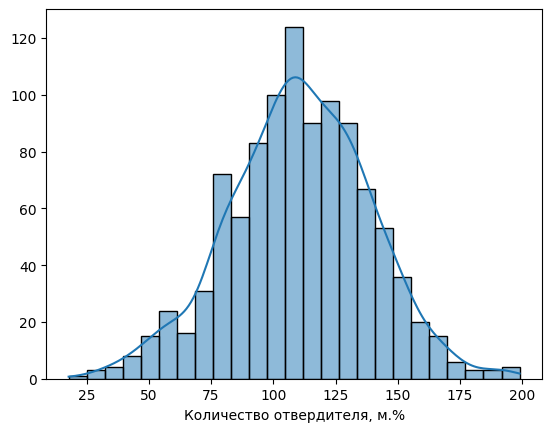

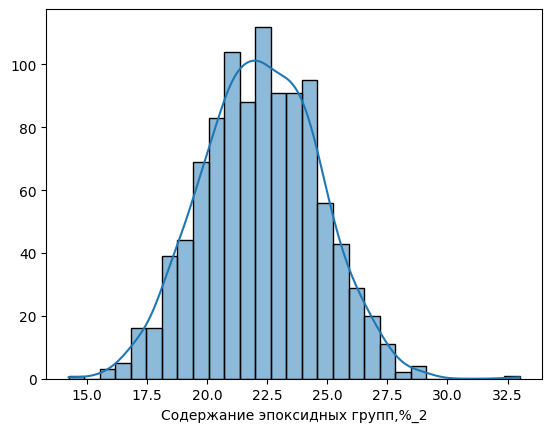

...

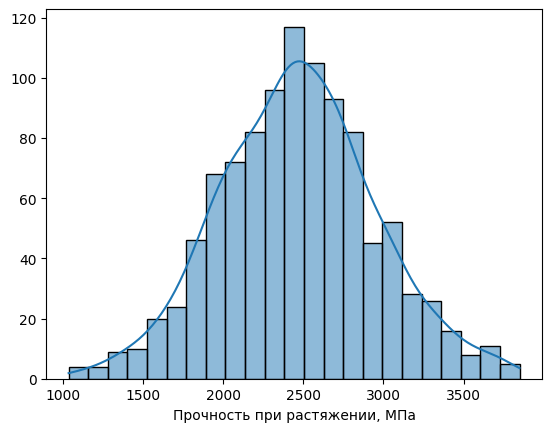

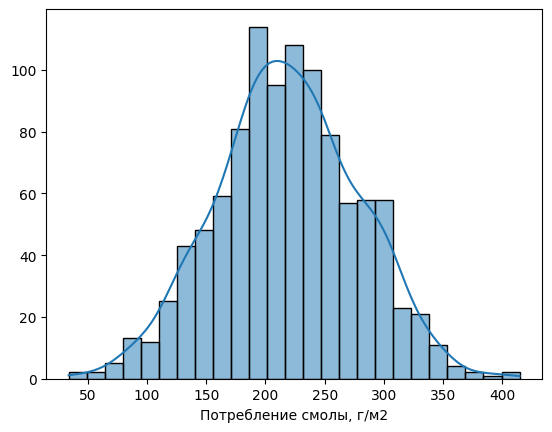

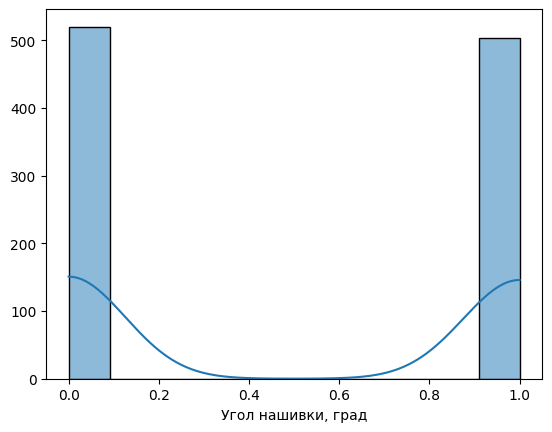

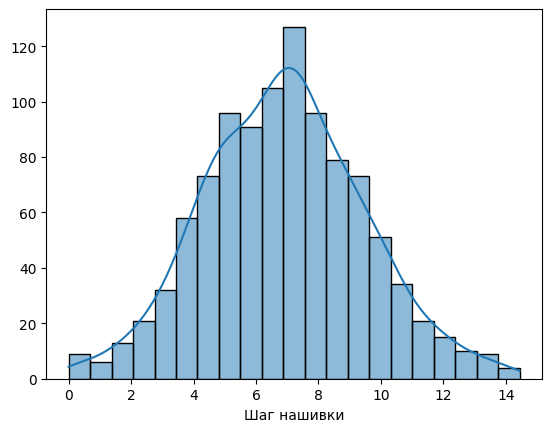

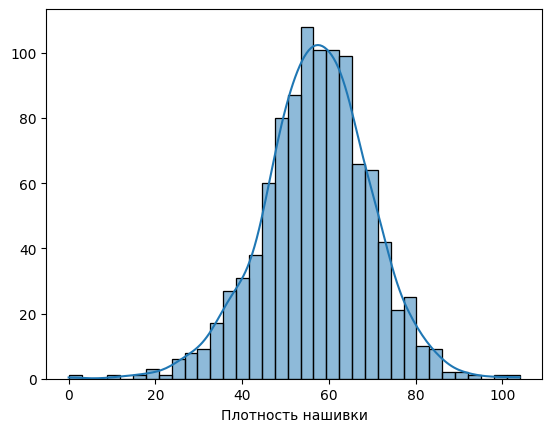

In [15]:
for col in dfall.columns:
    sns.histplot(dfall, x=dfall[col], kde=True)
    plt.ylabel(None)
    plt.show()

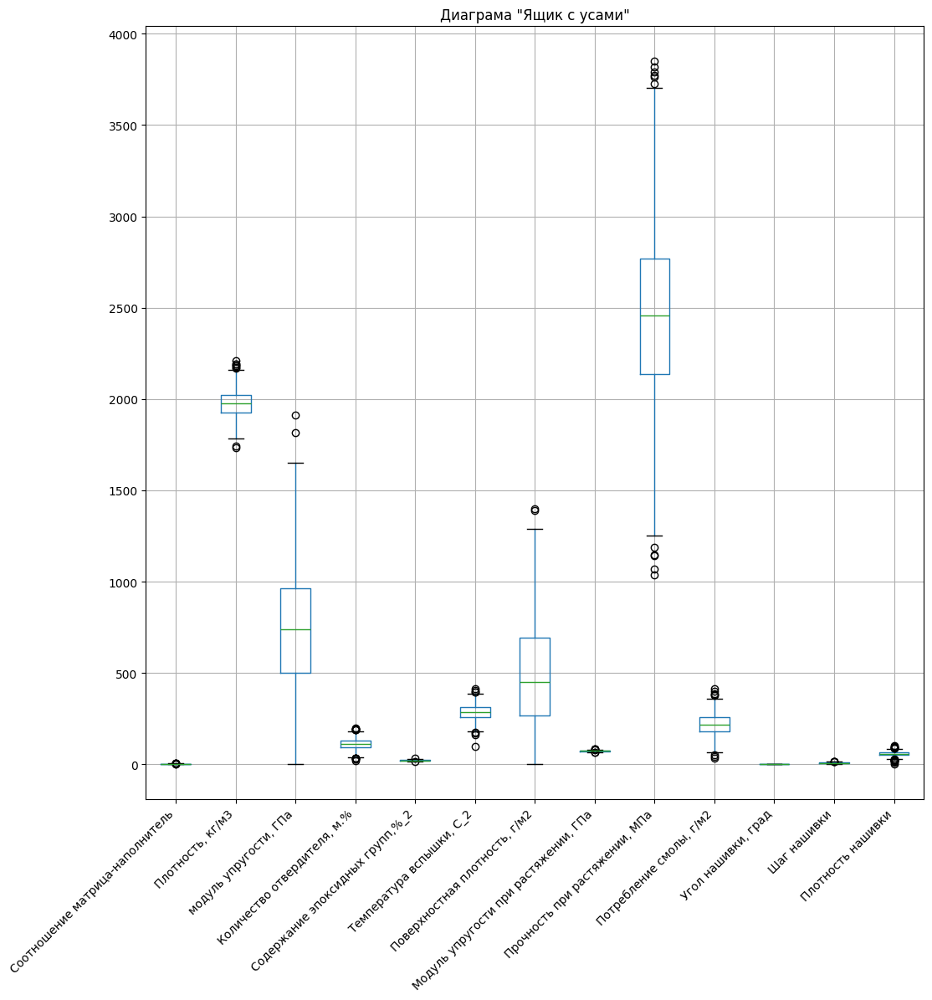

In [16]:
# Диаграма "Ящик с усами"
dfall.boxplot(figsize=(12,12))
plt.xticks(rotation=45, ha='right')
plt.title('Диаграма "Ящик с усами"')
plt.show()

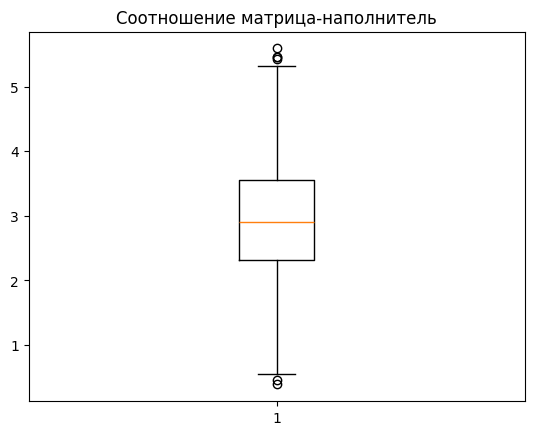

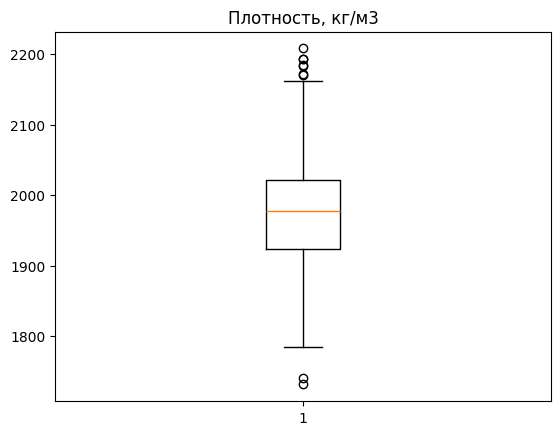

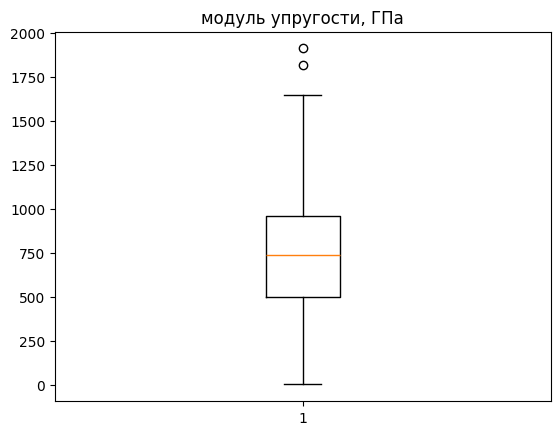

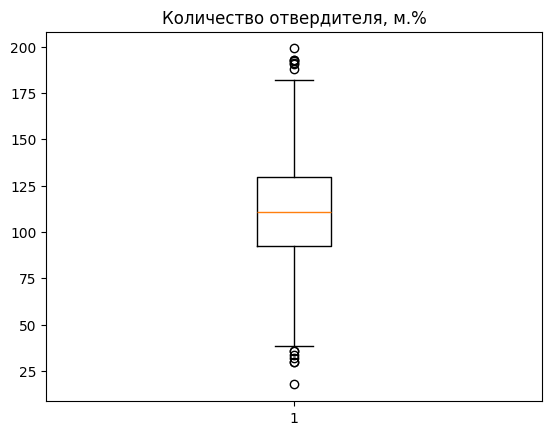

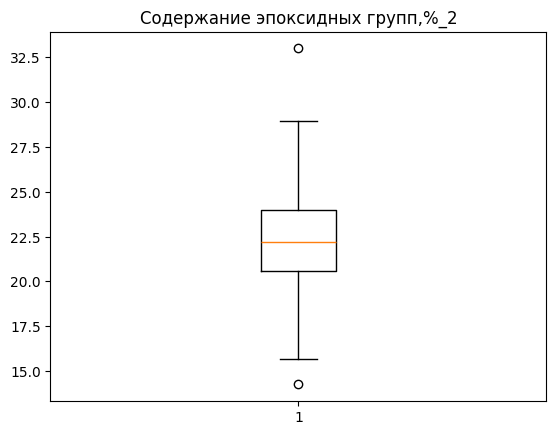

...

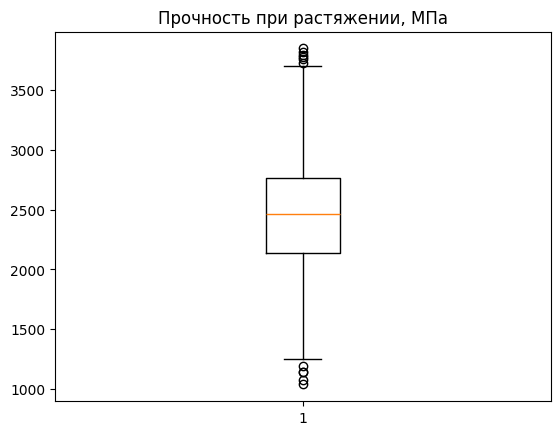

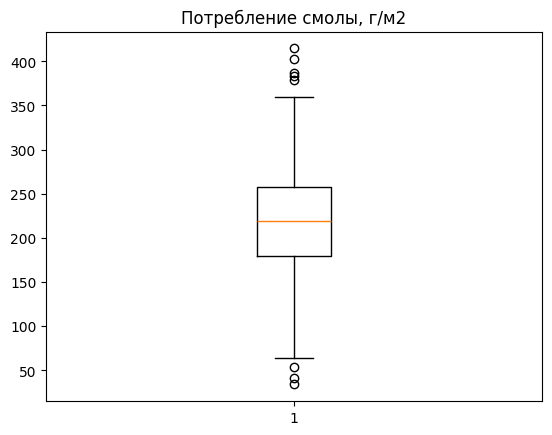

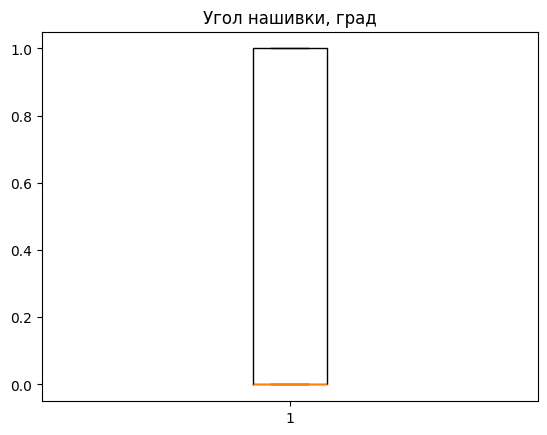

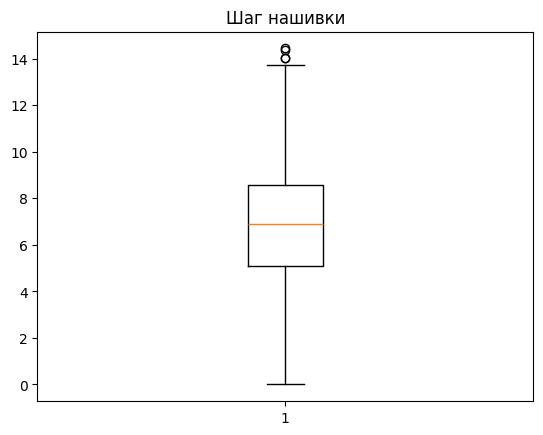

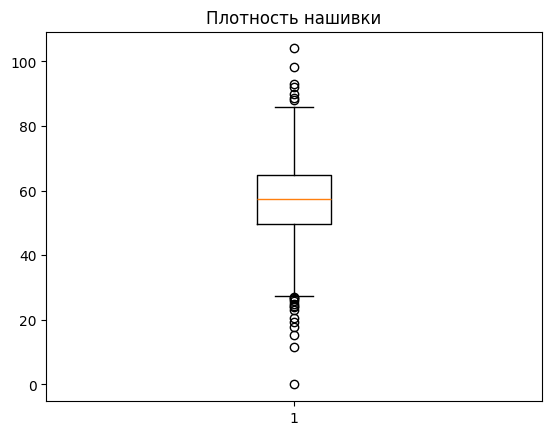

In [17]:
for col in dfall.columns:
    plt.boxplot(data=dfall, x=dfall[col])
    plt.title(col)
    plt.show()

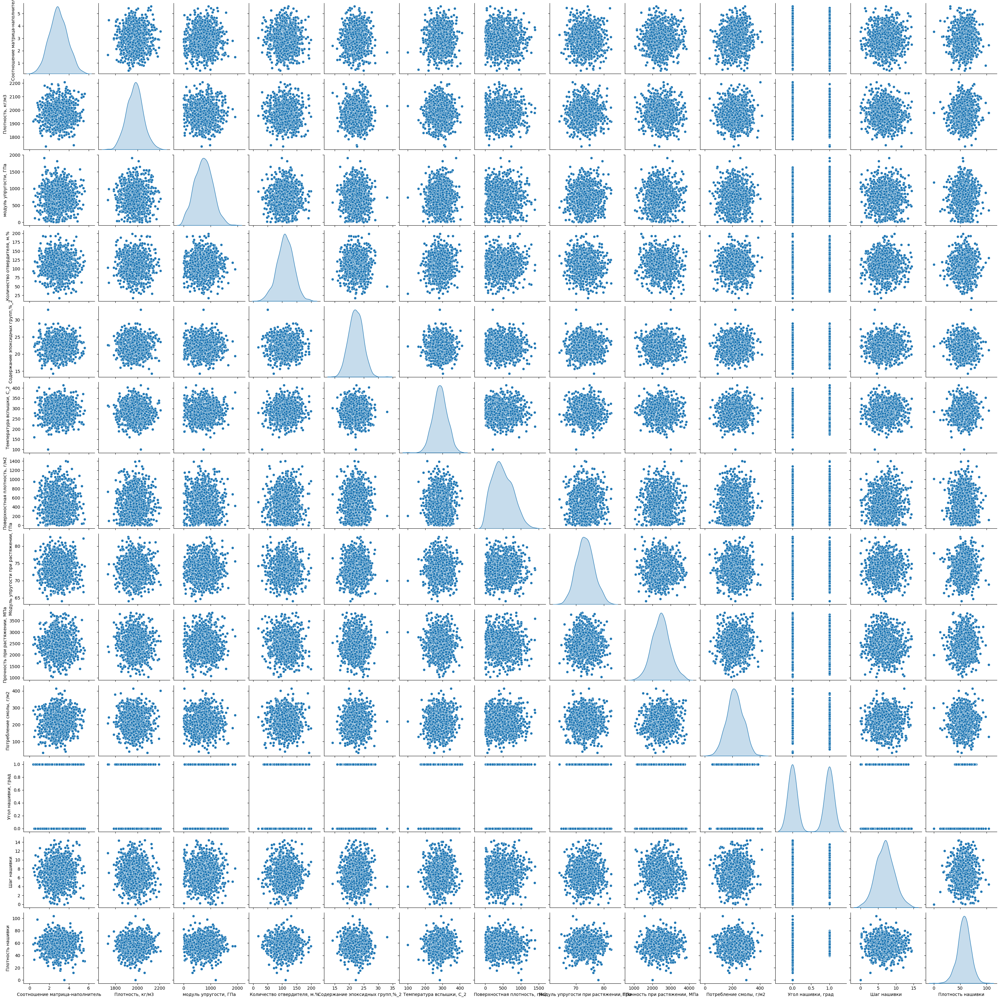

<Figure size 1400x1400 with 0 Axes>

In [18]:
# Попарные графики рассеивания точек
sns.pairplot(data=dfall,  diag_kind='kde')
plt.figure(figsize=(14,14))
plt.show()

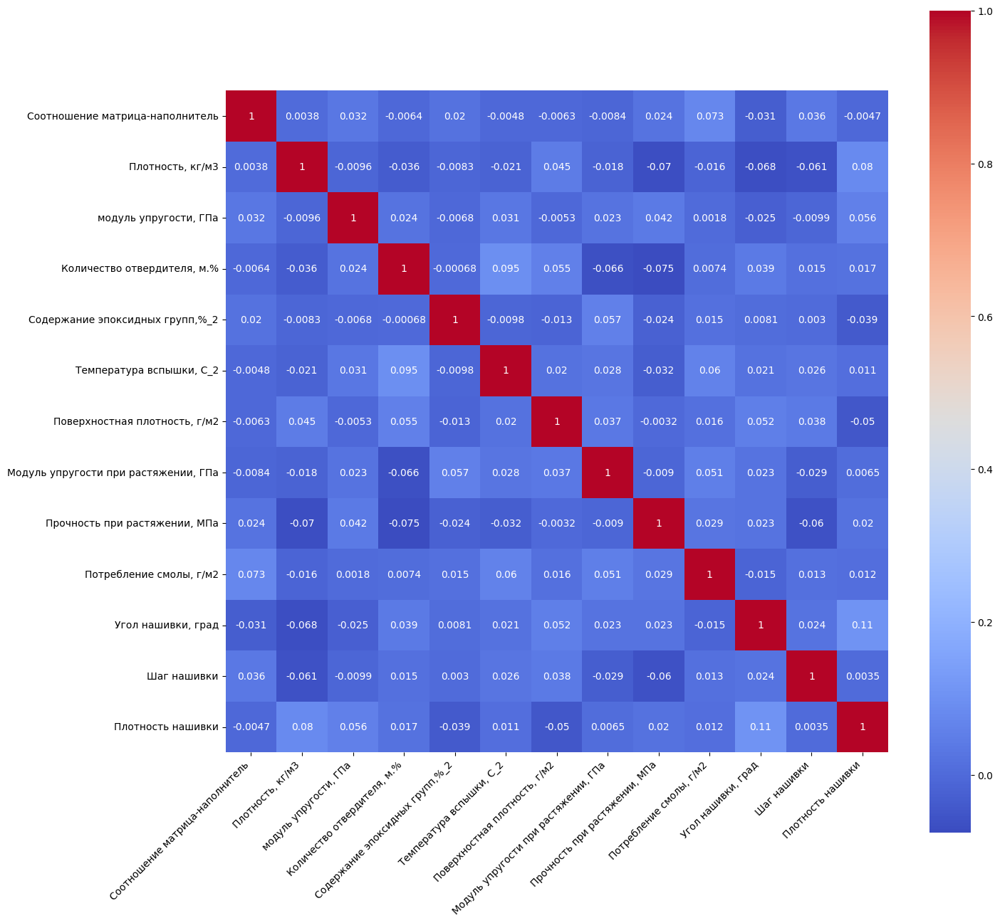

In [19]:
# Тепловая карта корреляции
plt.figure(figsize=(15,15))
dataplot = sns.heatmap(dfall.corr(), cmap='coolwarm', annot=True, square=True) 
plt.xticks(rotation=45, ha='right')
plt.show()

In [20]:
# Статистические характеристики
# Узнаем среднее и медианное значение по каждой колонке
mean_values = dfall.mean()
median_values = dfall.median()

print('Среденее значение:\n', mean_values)
print('------')
print('Медианное значение:\n', median_values)

Среденее значение:
 Соотношение матрица-наполнитель            2.930366
Плотность, кг/м3                        1975.734888
модуль упругости, ГПа                    739.923233
Количество отвердителя, м.%              110.570769
Содержание эпоксидных групп,%_2           22.244390
Температура вспышки, С_2                 285.882151
Поверхностная плотность, г/м2            482.731833
Модуль упругости при растяжении, ГПа      73.328571
Прочность при растяжении, МПа           2466.922843
Потребление смолы, г/м2                  218.423144
Угол нашивки, град                         0.491691
Шаг нашивки                                6.899222
Плотность нашивки                         57.153929
dtype: float64
------
Медианное значение:
 Соотношение матрица-наполнитель            2.906878
Плотность, кг/м3                        1977.621657
модуль упругости, ГПа                    739.664328
Количество отвердителя, м.%              110.564840
Содержание эпоксидных групп,%_2           22.230744
Т

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64


Text(0.5, 1.0, 'Пропуски')

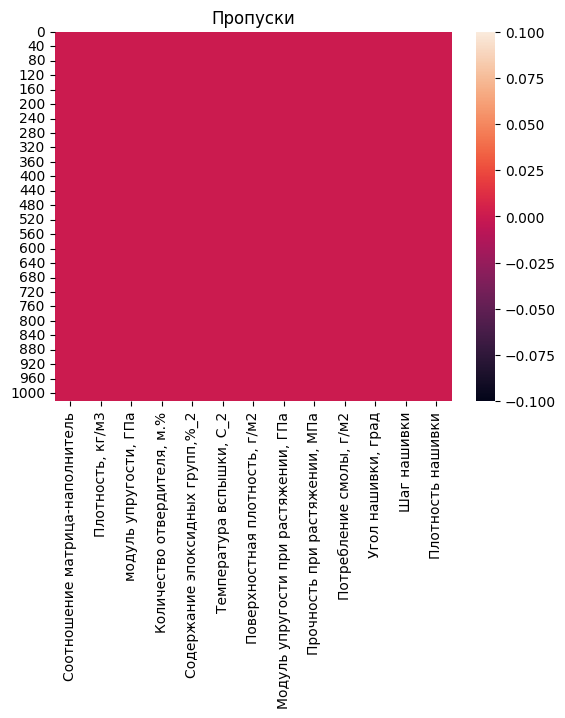

In [21]:
# Узнаем есть ли пропущенные значения с помощью .isnull().sum()
print(dfall.isnull().sum())

# Отлично пропусков нет, но визуализируем
col=dfall.columns
sns.heatmap(dfall[col].isnull())
plt.title('Пропуски')

# Пропуски не появились можно приступить к следующиму пункту

### 3. Предобработка данных включает удаление шумов, заполнение пропущенных значений,  нормализацию переменных и другие операции. 

##### Так как в пункте 2 нам надо: провести анализ и исключение выбросов, проверить наличие пропусков. Сделаем это в пункте 3. для исключения повторения кода в выпускной квалификационной работе

### Ниже приведен пример кода для реализации этого пункта:

In [22]:
# Пропуски отсутствуют поэтому сразу приступим к удалению
for column in dfall.columns:
    q75,q25 = np.percentile(dfall.loc[:,column],[75,25])
    intr_qr = q75-q25

    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)

    dfall.loc[dfall[column] < min,column] = np.nan
    dfall.loc[dfall[column] > max,column] = np.nan
# Узнаем что получилось с помощью .isnull().sum()
print(dfall.isnull().sum())

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64


In [23]:
# Удаляем выбросы
df_a=dfall.dropna(axis=0)

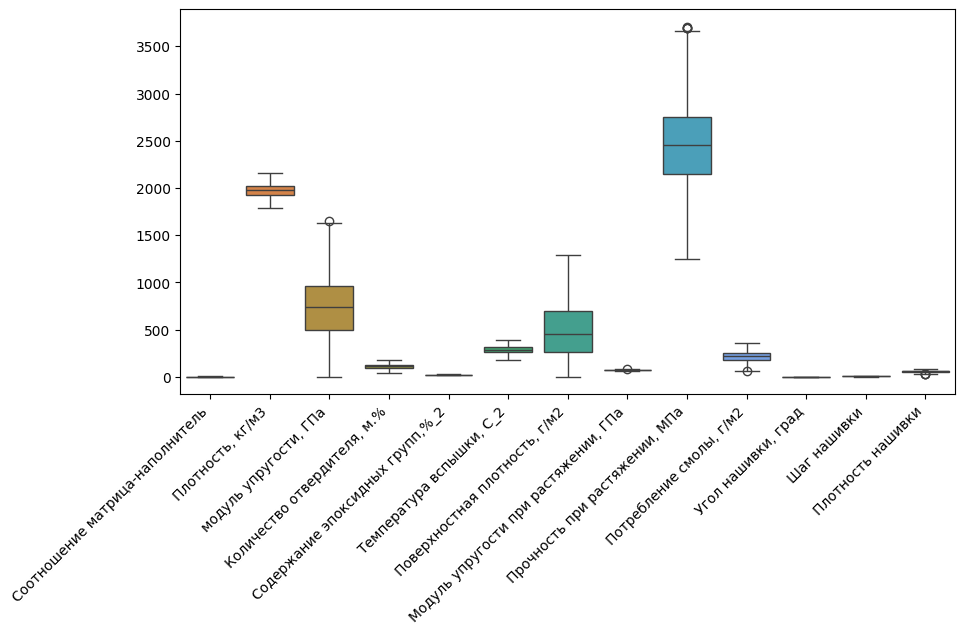

In [24]:
# Смотрим на то сколько выбросов осталось. Надо очищать 
plt.figure(figsize=(10,5))
sns.boxplot(df_a)
plt.xticks(rotation=45, ha='right')
plt.show()

In [25]:
# Удалим выбросы еще раз
# Пропуски отсутствуют по этому сразу приступим к удалению
for column in df_a.columns:
    q75,q25 = np.percentile(df_a.loc[:,column],[75,25])
    intr_qr = q75-q25

    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)

    df_a.loc[df_a[column] < min,column] = np.nan
    df_a.loc[df_a[column] > max,column] = np.nan
# Узнаем что получилось с помощью .isnull().sum()
print(df_a.isnull().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   1
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    1
Прочность при растяжении, МПа           4
Потребление смолы, г/м2                 1
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       3
dtype: int64


In [26]:
# Удаляем
df_a=df_a.dropna(axis=0)

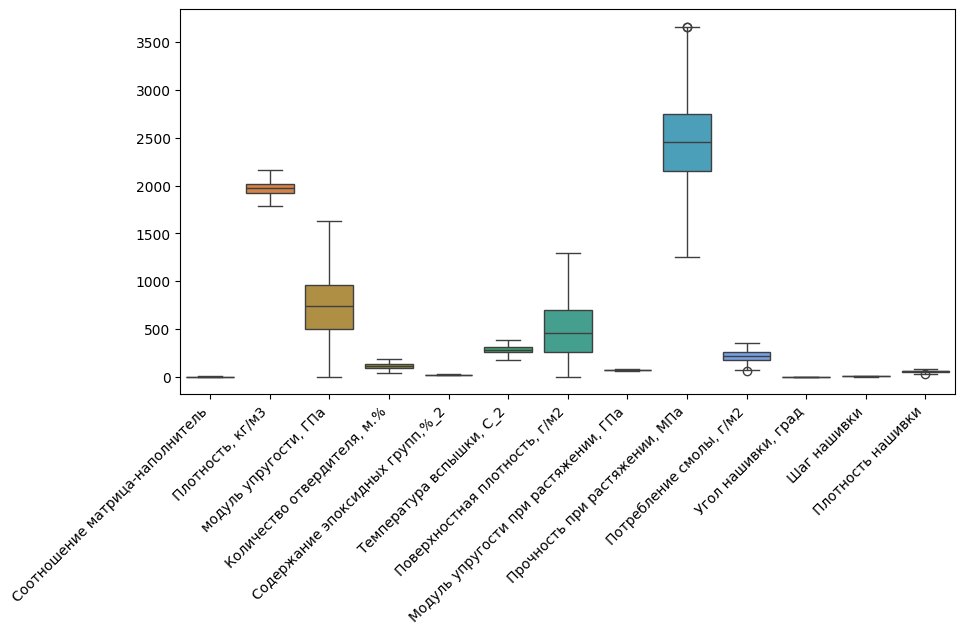

In [27]:
# Смотрим
plt.figure(figsize=(10,5))
sns.boxplot(df_a)
plt.xticks(rotation=45, ha='right')
plt.show()
# Выбросы остались 

In [28]:
# Повторим 
# Пропуски отсутствуют по этому сразу приступим к удалению
for column in df_a.columns:
    q75,q25 = np.percentile(df_a.loc[:,column],[75,25])
    intr_qr = q75-q25

    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)

    df_a.loc[df_a[column] < min,column] = np.nan
    df_a.loc[df_a[column] > max,column] = np.nan
# Узнаем что получилось с помощью .isnull().sum()
print(df_a.isnull().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           2
Потребление смолы, г/м2                 1
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       1
dtype: int64


In [29]:
# Удаляем
df_a=df_a.dropna(axis=0)

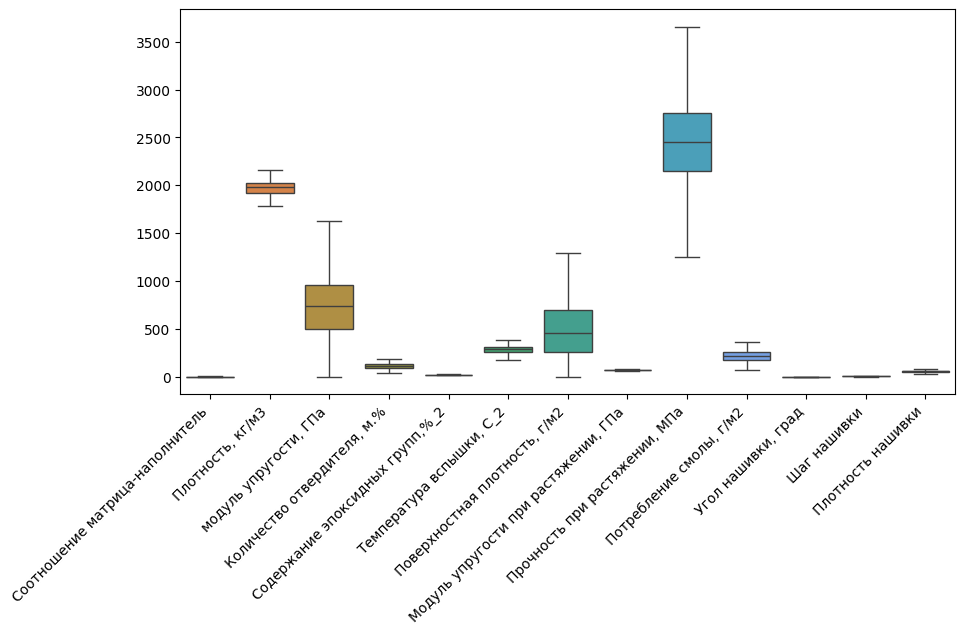

(922, 13)


In [30]:
# Смотрим 
plt.figure(figsize=(10,5))
sns.boxplot(df_a)
plt.xticks(rotation=45, ha='right')
plt.show()

# Выбросов удалены все, взглянем сколько осталось строк и стобцов
print(df_a.shape)

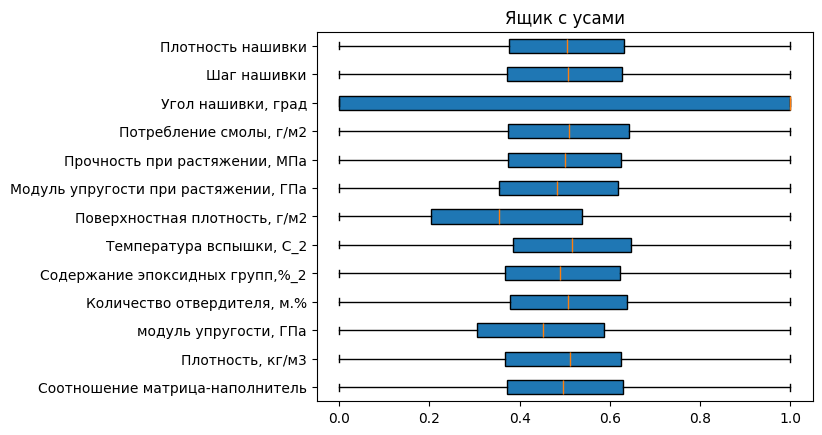

<Figure size 1400x1400 with 0 Axes>

In [31]:
# Отлично мы очислили датасет
# Теперь посмотрим, что получится на диаграмме после удаления 

# Импортируем нужные библиотеки для нормализации датасета
import sklearn
from sklearn.preprocessing import MinMaxScaler

# Посмотрим на данные с помощью применения MinMaxScaler
scaler=MinMaxScaler()
scaler.fit(df_a)
# Визуализируем
plt.title('Ящик с усами')
plt.boxplot(pd.DataFrame(scaler.transform(df_a)), labels=df_a.columns, patch_artist=True, vert=False)
plt.figure(figsize=(14,14))
plt.show()

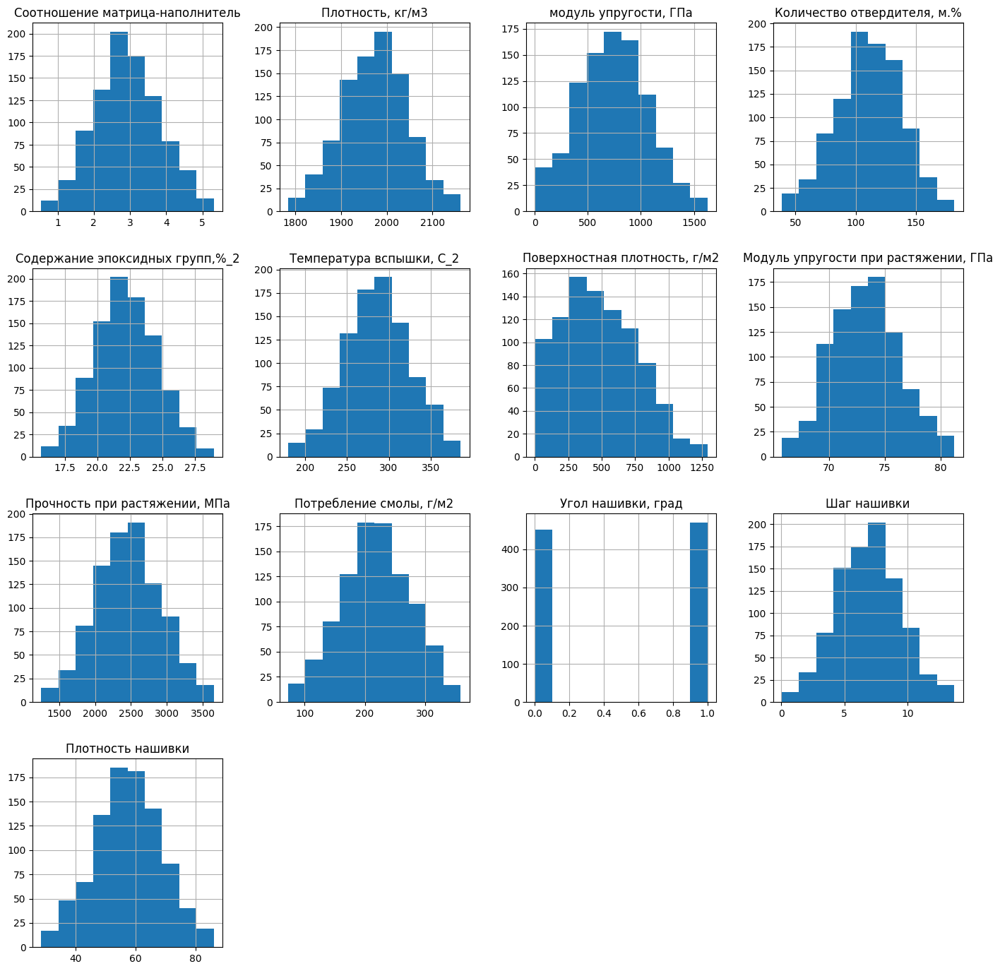

In [32]:
# Посмотри на гисторграмму распредения без нормализации
df_a.hist(figsize=(17,17))
plt.show()

In [33]:
# Корреляция между параметрами
df_a.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.007996,0.051643,0.001353,0.021982,-0.010565,0.011910,-0.024316,0.019141,0.076857,-0.032144,0.039924,0.047835
"Плотность, кг/м3",0.007996,1.000000,-0.001416,-0.048938,0.004568,-0.021256,0.061496,-0.015597,-0.079188,-0.009609,-0.052993,-0.048648,0.086460
"модуль упругости, ГПа",0.051643,-0.001416,1.000000,0.044550,-0.001442,0.037622,-0.007805,0.020063,0.031041,0.008368,-0.031490,0.010238,0.078810
"Количество отвердителя, м.%",0.001353,-0.048938,0.044550,1.000000,0.011429,0.070623,0.038762,-0.057026,-0.065711,-0.014827,0.034103,-0.017394,0.007981
"Содержание эпоксидных групп,%_2",0.021982,0.004568,-0.001442,0.011429,1.000000,-0.025315,-0.015844,0.053887,-0.013099,0.010808,0.034520,0.007571,-0.034481
"Температура вспышки, С_2",-0.010565,-0.021256,0.037622,0.070623,-0.025315,1.000000,0.020307,0.014168,-0.017263,0.048142,0.002371,0.034395,-0.015014
"Поверхностная плотность, г/м2",0.011910,0.061496,-0.007805,0.038762,-0.015844,0.020307,1.000000,0.033526,-0.027320,-0.012606,0.053180,0.036931,-0.034989
"Модуль упругости при растяжении, ГПа",-0.024316,-0.015597,0.020063,-0.057026,0.053887,0.014168,0.033526,1.000000,-0.002393,0.051676,0.031910,-0.010193,0.012488
"Прочность при растяжении, МПа",0.019141,-0.079188,0.031041,-0.065711,-0.013099,-0.017263,-0.027320,-0.002393,1.000000,0.016753,0.016144,-0.051580,0.016311
"Потребление смолы, г/м2",0.076857,-0.009609,0.008368,-0.014827,0.010808,0.048142,-0.012606,0.051676,0.016753,1.000000,0.000433,0.009932,0.008012


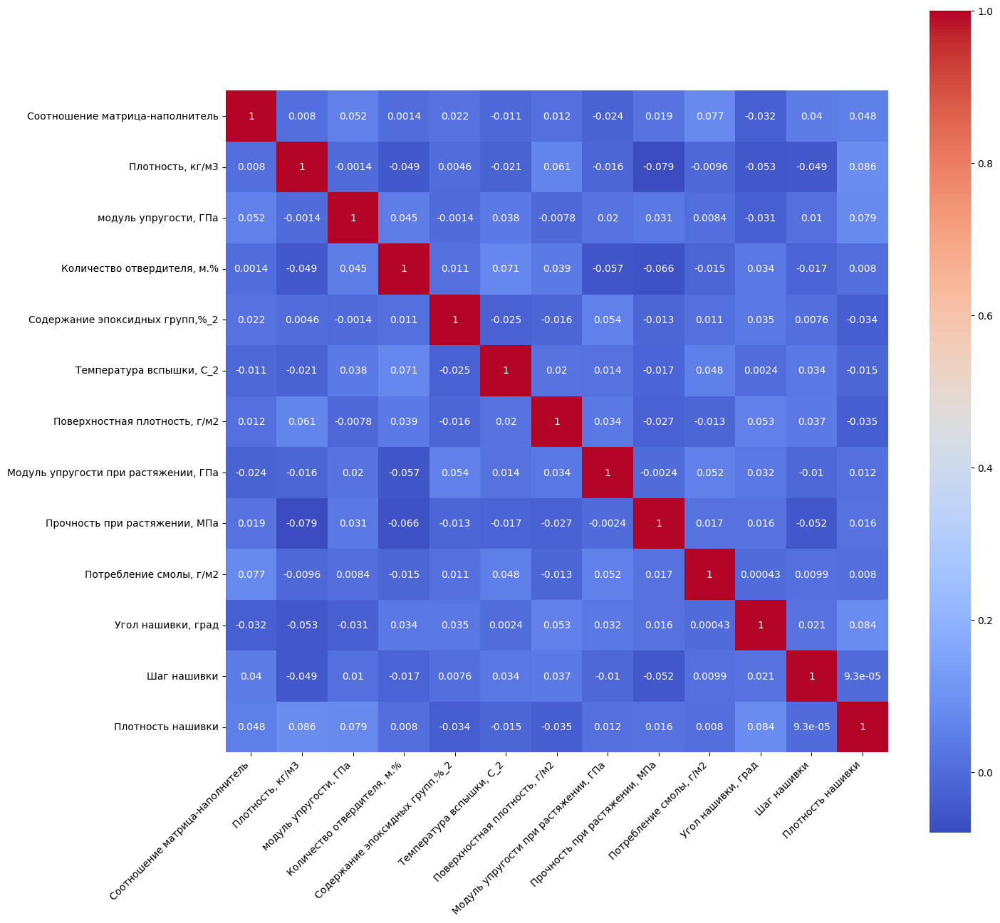

In [34]:
# Тепловая карта корреляции
plt.figure(figsize=(15,15))
dataplot = sns.heatmap(df_a.corr(), cmap='coolwarm', annot=True, square=True) 
plt.xticks(rotation=45, ha='right')
plt.show()

In [35]:
# Статистические характеристики
# Узнаем среднее и медианное значение по каждой колонке
mean_values = df_a.mean()
median_values = df_a.median()

print('Среденее значение:\n', mean_values)
print('------')
print('Медианное значение:\n', median_values)

Среденее значение:
 Соотношение матрица-наполнитель            2.927964
Плотность, кг/м3                        1974.118744
модуль упругости, ГПа                    736.119982
Количество отвердителя, м.%              111.136066
Содержание эпоксидных групп,%_2           22.200570
Температура вспышки, С_2                 286.181128
Поверхностная плотность, г/м2            482.429070
Модуль упругости при растяжении, ГПа      73.303464
Прочность при растяжении, МПа           2461.491315
Потребление смолы, г/м2                  218.048059
Угол нашивки, град                         0.510846
Шаг нашивки                                6.931939
Плотность нашивки                         57.562887
dtype: float64
------
Медианное значение:
 Соотношение матрица-наполнитель            2.907832
Плотность, кг/м3                        1977.321002
модуль упругости, ГПа                    736.178435
Количество отвердителя, м.%              111.162090
Содержание эпоксидных групп,%_2           22.177681
Т

In [36]:
# Создадим новую переменную для нормализации
df_n=df_a.copy()

In [37]:
df_n.info()

<class 'pandas.core.frame.DataFrame'>
Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки, град                    922 non-null    float64
 11  Шаг нашивки            

<Axes: ylabel='Density'>

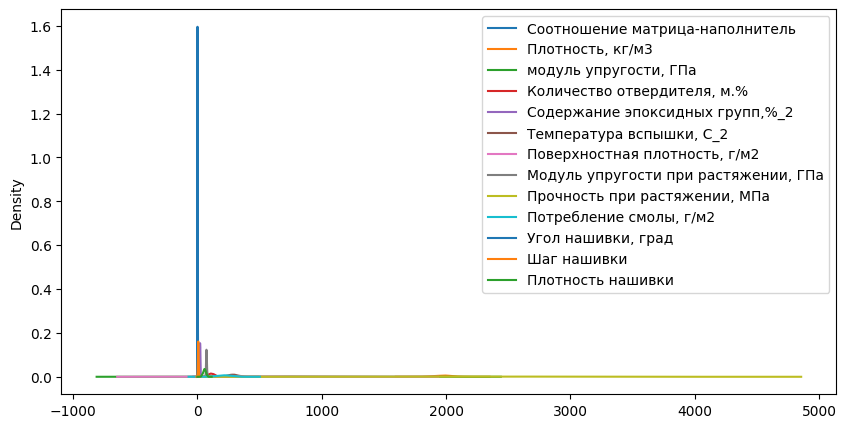

In [38]:
fig, ax=plt.subplots(figsize=(10,5))
df_n.plot(kind='kde', ax=ax)

In [39]:
# Данные находятся в разных диапазонах, нужно нормализовать. Присутупаем к нормализации
# Нормализуем данные с помощью MinMaxScaler

scaler=MinMaxScaler()
col=df_n.columns
result=scaler.fit_transform(df_n)

df_n_minmax=pd.DataFrame(result, columns=col)
df_n_minmax.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.499412,0.502904,0.451341,0.506200,0.490578,0.516739,0.373295,0.487343,0.503776,0.507876,0.510846,0.503426,0.503938
std,0.187858,0.188395,0.201534,0.186876,0.180548,0.190721,0.217269,0.196366,0.188668,0.199418,0.500154,0.183587,0.193933
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.371909,0.368184,0.305188,0.378514,0.366571,0.386228,0.204335,0.353512,0.373447,0.374647,0.000000,0.372844,0.376869
50%,0.495189,0.511396,0.451377,0.506382,0.488852,0.516931,0.354161,0.483718,0.501481,0.510143,1.000000,0.506414,0.504310
75%,0.629774,0.624719,0.587193,0.638735,0.623046,0.646553,0.538397,0.617568,0.624299,0.642511,1.000000,0.626112,0.630842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


[Text(0, 0, 'Соотношение матрица-наполнитель'),
 Text(1, 0, 'Плотность, кг/м3'),
 Text(2, 0, 'модуль упругости, ГПа'),
 Text(3, 0, 'Количество отвердителя, м.%'),
 Text(4, 0, 'Содержание эпоксидных групп,%_2'),
 Text(5, 0, 'Температура вспышки, С_2'),
 Text(6, 0, 'Поверхностная плотность, г/м2'),
 Text(7, 0, 'Модуль упругости при растяжении, ГПа'),
 Text(8, 0, 'Прочность при растяжении, МПа'),
 Text(9, 0, 'Потребление смолы, г/м2'),
 Text(10, 0, 'Угол нашивки, град'),
 Text(11, 0, 'Шаг нашивки'),
 Text(12, 0, 'Плотность нашивки')]

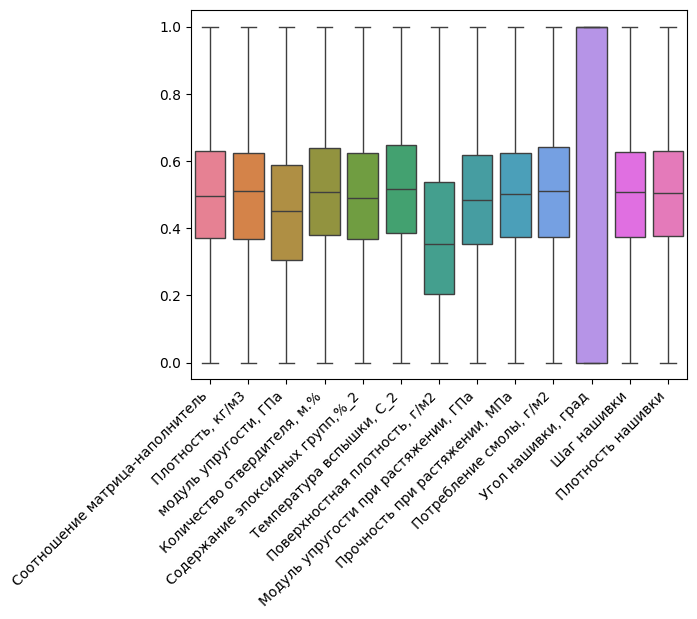

<Figure size 1400x700 with 0 Axes>

In [40]:
# Посмотрим на датасет нормализованный
ax=sns.boxplot(data=df_n_minmax)
plt.figure(figsize=(14,7))
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

In [41]:
# Импортируем нужную библиотеку
from sklearn.preprocessing import Normalizer
# Нормализируем
norma=Normalizer()
res=norma.fit_transform(df_n)
df_norma=pd.DataFrame(res, columns=df_n.columns)
# Выводим данные которые получились
df_norma

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.000000,0.001075,0.016121
1,0.000499,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.000000,0.001342,0.012618
2,0.000744,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.000000,0.001342,0.015298
3,0.000746,0.539271,0.201687,0.030161,0.006004,0.076742,0.056623,0.018874,0.808906,0.059320,0.000000,0.001348,0.016178
4,0.000699,0.519919,0.219673,0.030449,0.006062,0.077475,0.057164,0.019055,0.816627,0.059886,0.000000,0.001361,0.019055
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.000700,0.601751,0.281397,0.026816,0.006203,0.100115,0.064488,0.022531,0.735908,0.038535,0.000308,0.002798,0.014494
918,0.001078,0.641795,0.139227,0.045701,0.006136,0.079584,0.109777,0.022828,0.738938,0.036856,0.000313,0.003308,0.016827
919,0.000953,0.573123,0.121122,0.032118,0.006961,0.072186,0.215067,0.021716,0.773775,0.068752,0.000291,0.001209,0.019652
920,0.001192,0.664667,0.238453,0.045473,0.006190,0.088689,0.206291,0.023812,0.666248,0.063394,0.000322,0.002030,0.018736


<Axes: ylabel='Density'>

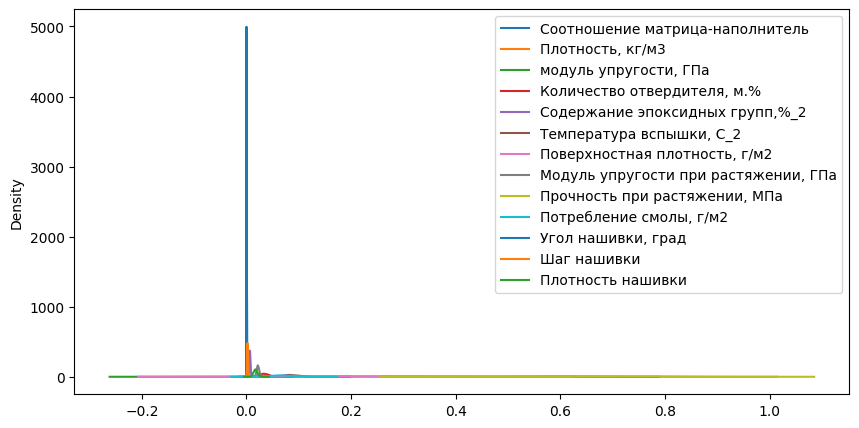

In [42]:
fig, ax =plt.subplots(figsize=(10,5))
df_norma.plot(kind='kde', ax=ax)

In [43]:
# Посмотрим на то что было до нормализации
df_a.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,60.0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,70.0


In [44]:
# Перевод данных из нормализованных в исходные
col=df_n_minmax.columns
result_reverse=scaler.inverse_transform(df_n_minmax)
initial_data=pd.DataFrame(result_reverse, columns=col)
initial_data.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
1,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
2,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0
3,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,60.0
4,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,70.0


In [45]:
# Рассмотрим корреляцию после нормализации (1-ый вариант)
df_norma[df_norma.columns].corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.281512,0.032460,0.137378,0.221541,0.180002,0.025513,0.262013,-0.257978,0.157659,-0.010611,0.136843,0.175839
"Плотность, кг/м3",0.281512,1.000000,-0.042233,0.390253,0.658281,0.564884,0.067392,0.875269,-0.837849,0.314219,0.082452,0.291974,0.445379
"модуль упругости, ГПа",0.032460,-0.042233,1.000000,0.049364,-0.028060,0.003038,-0.026006,-0.026914,-0.386917,-0.009529,-0.039522,0.002268,0.044303
"Количество отвердителя, м.%",0.137378,0.390253,0.049364,1.000000,0.305395,0.311569,0.067273,0.376425,-0.379828,0.143166,0.064597,0.121374,0.203167
"Содержание эпоксидных групп,%_2",0.221541,0.658281,-0.028060,0.305395,1.000000,0.404877,0.027470,0.660206,-0.551282,0.244822,0.098492,0.236752,0.280886
"Температура вспышки, С_2",0.180002,0.564884,0.003038,0.311569,0.404877,1.000000,0.038395,0.563793,-0.509841,0.246410,0.063124,0.216858,0.260809
"Поверхностная плотность, г/м2",0.025513,0.067392,-0.026006,0.067273,0.027470,0.038395,1.000000,0.055252,-0.318775,0.007772,0.043869,0.065979,-0.017402
"Модуль упругости при растяжении, ГПа",0.262013,0.875269,-0.026914,0.376425,0.660206,0.563793,0.055252,1.000000,-0.741163,0.328966,0.109996,0.302476,0.416465
"Прочность при растяжении, МПа",-0.257978,-0.837849,-0.386917,-0.379828,-0.551282,-0.509841,-0.318775,-0.741163,1.000000,-0.282606,-0.058592,-0.279843,-0.379346
"Потребление смолы, г/м2",0.157659,0.314219,-0.009529,0.143166,0.244822,0.246410,0.007772,0.328966,-0.282606,1.000000,0.033128,0.116685,0.140756


In [46]:
# Рассмотрим корреляцию после нормализации (2-ой вариант)
df_n_minmax[df_n_minmax.columns].corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.007996,0.051643,0.001353,0.021982,-0.010565,0.011910,-0.024316,0.019141,0.076857,-0.032144,0.039924,0.047835
"Плотность, кг/м3",0.007996,1.000000,-0.001416,-0.048938,0.004568,-0.021256,0.061496,-0.015597,-0.079188,-0.009609,-0.052993,-0.048648,0.086460
"модуль упругости, ГПа",0.051643,-0.001416,1.000000,0.044550,-0.001442,0.037622,-0.007805,0.020063,0.031041,0.008368,-0.031490,0.010238,0.078810
"Количество отвердителя, м.%",0.001353,-0.048938,0.044550,1.000000,0.011429,0.070623,0.038762,-0.057026,-0.065711,-0.014827,0.034103,-0.017394,0.007981
"Содержание эпоксидных групп,%_2",0.021982,0.004568,-0.001442,0.011429,1.000000,-0.025315,-0.015844,0.053887,-0.013099,0.010808,0.034520,0.007571,-0.034481
"Температура вспышки, С_2",-0.010565,-0.021256,0.037622,0.070623,-0.025315,1.000000,0.020307,0.014168,-0.017263,0.048142,0.002371,0.034395,-0.015014
"Поверхностная плотность, г/м2",0.011910,0.061496,-0.007805,0.038762,-0.015844,0.020307,1.000000,0.033526,-0.027320,-0.012606,0.053180,0.036931,-0.034989
"Модуль упругости при растяжении, ГПа",-0.024316,-0.015597,0.020063,-0.057026,0.053887,0.014168,0.033526,1.000000,-0.002393,0.051676,0.031910,-0.010193,0.012488
"Прочность при растяжении, МПа",0.019141,-0.079188,0.031041,-0.065711,-0.013099,-0.017263,-0.027320,-0.002393,1.000000,0.016753,0.016144,-0.051580,0.016311
"Потребление смолы, г/м2",0.076857,-0.009609,0.008368,-0.014827,0.010808,0.048142,-0.012606,0.051676,0.016753,1.000000,0.000433,0.009932,0.008012


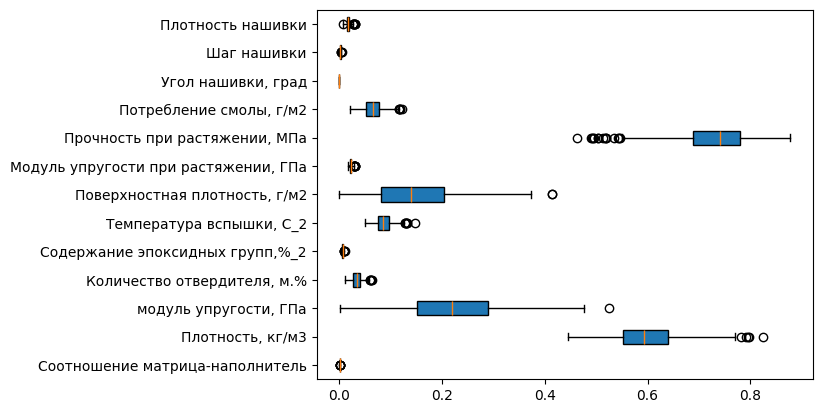

<Figure size 1700x1700 with 0 Axes>

In [47]:
# Построим "ящик с усами" при нормализер
scaler=Normalizer()
scaler.fit(df_norma)
plt.boxplot(pd.DataFrame(scaler.transform(df_norma)), labels=df_norma.columns, 
            patch_artist = True, meanline = True, vert = False)
plt.figure(figsize=(17,17))
plt.show()

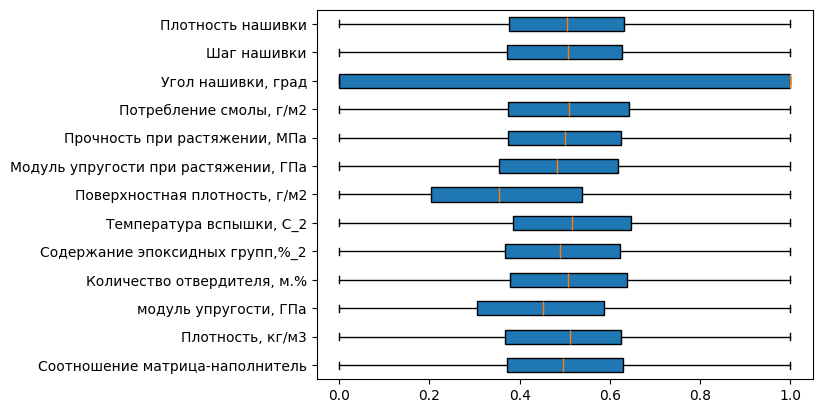

<Figure size 1700x1700 with 0 Axes>

In [48]:
# Построим "ящик с усами" при MinMax
scaler=MinMaxScaler()
scaler.fit(df_n_minmax)
plt.boxplot(pd.DataFrame(scaler.transform(df_n_minmax)), labels=df_norma.columns, 
            patch_artist = True, meanline = True, vert = False)
plt.figure(figsize=(17,17))
plt.show()

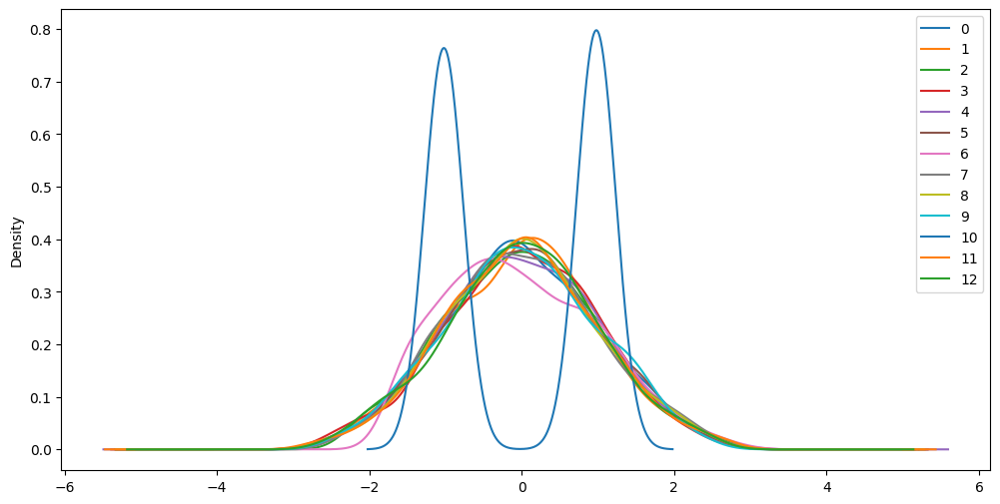

In [49]:
# Визуализация графиков показывает, что нормализация при помощи "Normalizer" 
#  дает нам большое количество выбросов

# Стандитизируем данные
X1=df_n_minmax.copy()
X2=df_norma.copy()

# Импортируем нужную библиотеку
from sklearn.preprocessing import StandardScaler

df_stan_X1=StandardScaler().fit(X1)
df_standart_X1=df_stan_X1.transform(X1)
df_standart_1=pd.DataFrame(df_standart_X1)

fig, ax = plt.subplots(figsize = (12, 6))
df_standart_1.plot(kind = 'kde', ax = ax)
plt.show()

In [50]:
df_standart_1

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.196467,0.787037,0.007992,-2.286425,0.647585,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-1.166792,0.219240
1,-1.196467,0.787037,0.007992,0.668092,-0.397291,0.350738,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.950227
2,-0.175012,0.787037,0.051553,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.050637
3,-0.178825,0.364514,0.036283,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,0.219240
4,-0.400390,-0.903054,0.216474,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,1.118831
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,-0.733662,-0.310284,0.539767,-0.902956,-0.868217,0.979545,-0.974830,-0.070267,-0.163679,-1.629244,0.978538,0.853400,-0.948449
918,0.576611,1.069974,-0.889924,1.303201,-1.087006,-0.811326,-0.470122,-0.126524,-0.223019,-1.756683,0.978538,1.446055,-0.342933
919,0.394018,-0.024589,-0.975122,-0.022536,0.734311,-0.958342,0.919470,0.473140,0.444312,0.324984,0.978538,-1.102660,0.905599
920,0.868603,1.305328,0.016356,1.131763,-1.234469,-0.263996,0.567419,0.244441,-0.859827,-0.366368,0.978538,-0.246233,0.062808


<Axes: ylabel='Density'>

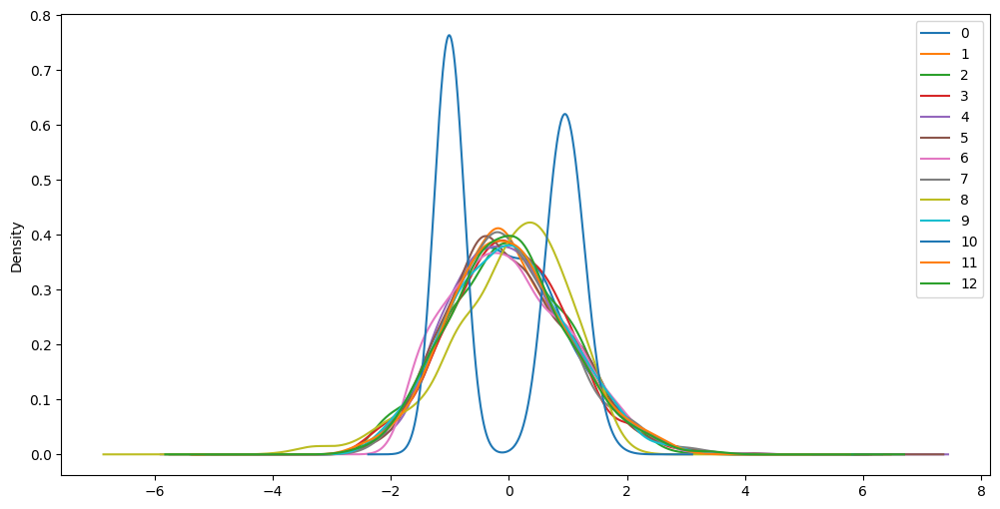

In [51]:
df_stan_X2=StandardScaler().fit(X2)
df_standart_X2=df_stan_X2.transform(X2)
df_standart_2=pd.DataFrame(df_standart_X2)

fig, ax = plt.subplots(figsize = (12, 6))
df_standart_2.plot(kind = 'kde', ax = ax)

In [52]:
df_standart_2

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.350498,-0.800587,-0.225645,-2.254951,-0.330124,-0.671638,-1.055275,-1.355362,1.083430,-0.367448,-1.010316,-1.270050,-0.337462
1,-1.351860,-0.807188,-0.227264,0.108938,-0.995822,-0.400917,-1.055800,-1.361270,1.074341,-0.369941,-1.010316,-0.938747,-1.261078
2,-0.493829,-0.810003,-0.187937,-0.405305,-0.728743,-0.677298,-1.056024,-1.363790,1.070465,-0.371004,-1.010316,-0.939301,-0.554499
3,-0.484962,-0.896227,-0.192219,-0.389758,-0.701418,-0.653706,-1.052902,-1.328659,1.124504,-0.356180,-1.010316,-0.931586,-0.322473
4,-0.648927,-1.196396,-0.004208,-0.357656,-0.644997,-0.604992,-1.046455,-1.256122,1.236081,-0.325573,-1.010316,-0.915657,0.436003
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,-0.646503,0.072936,0.641033,-0.762769,-0.505500,0.900672,-0.959086,0.143638,0.069576,-1.479779,1.005415,0.862968,-0.766453
918,0.676313,0.694067,-0.845152,1.342997,-0.571810,-0.464729,-0.418815,0.263359,0.113365,-1.570525,1.036781,1.493975,-0.151358
919,0.239190,-0.371131,-1.034407,-0.171548,0.241010,-0.956746,0.837232,-0.184553,0.616810,0.153718,0.889772,-1.103709,0.593392
920,1.073279,1.048848,0.192114,1.317553,-0.518818,0.140773,0.732541,0.659236,-0.937103,-0.135918,1.092595,-0.087233,0.352074


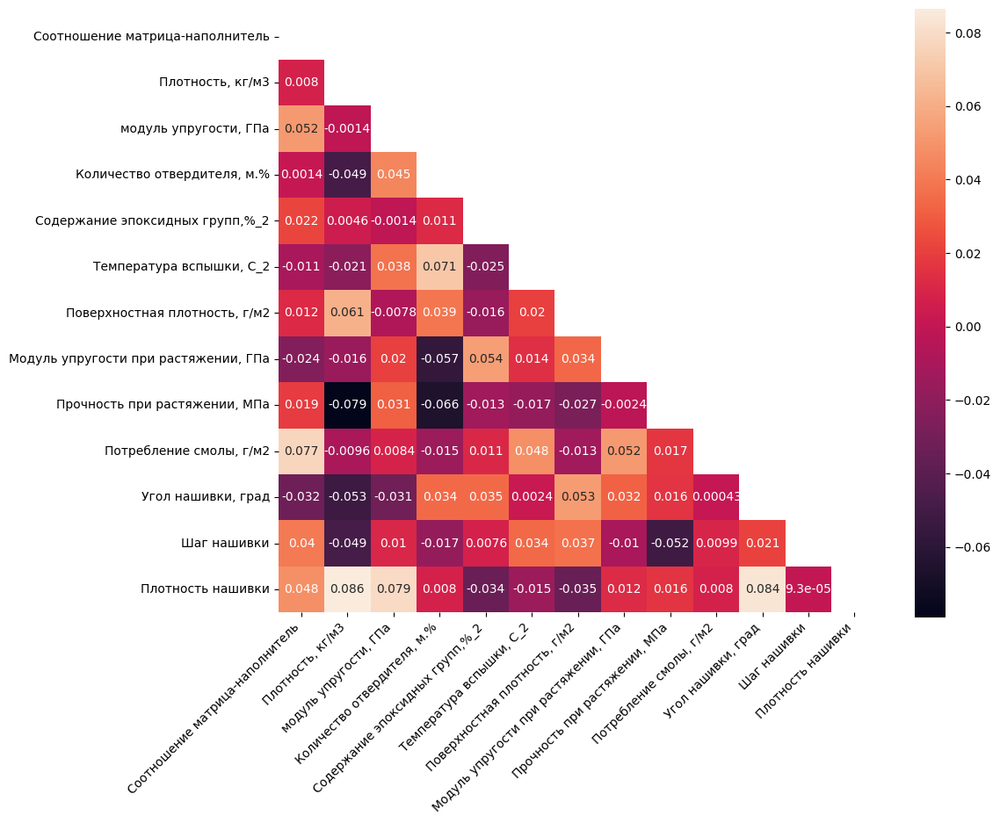

In [53]:
mask = np.triu(X1.corr())
f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(X1.corr(), mask=mask, annot=True, square=True)
plt.xticks(rotation=45, ha='right')
plt.show()

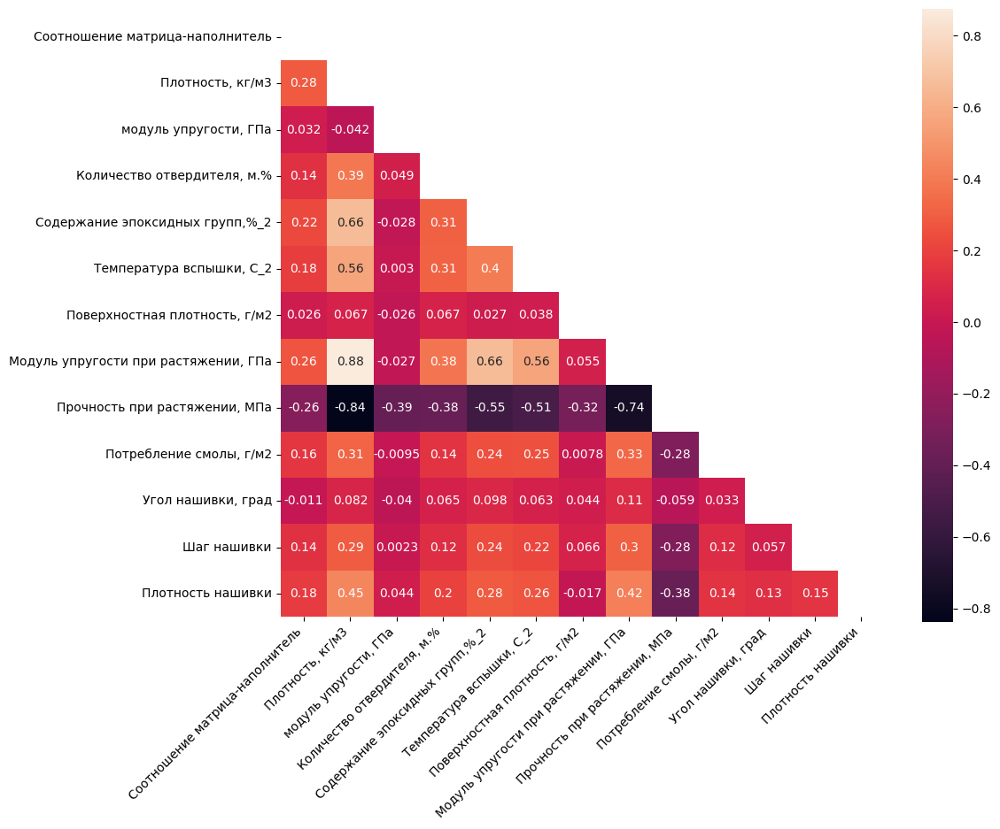

In [54]:
mask = np.triu(X2.corr())
f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(X2.corr(), mask=mask, annot=True, square=True)
plt.xticks(rotation=45, ha='right')
plt.show()

### 4. Для обучения моделей можно использовать библиотеку scikit-learn, выбрав подходящую модель и произведя ее обучение на доступных данных. Ниже приведен пример кода для обучения модели с использованием:
- Метод опорных векторов.
- «Случайный лес».
- Линейная регрессия.
- Градиентный бустинг.
- Метод k-ближайших соседей.

#### Нам надо обучить нескольких моделей для прогноза модуля упругости при растяжении и прочности при растяжении. При построении модели необходимо 30% данных оставить на тестирование модели, на остальных происходит обучение моделей. При построении моделей провести поиск гиперпараметров модели с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10.

#### Прогноз прочность при растяжении, МПа

In [55]:
# Имортируем библиотеки для создания нужных нам выборок
from sklearn.model_selection import train_test_split
# Разбиваем на тестовую и тренировочную выборку
X=df_norma.loc[:, df_norma.columns != 'Прочность при растяжении, МПа']
y=df_a[['Прочность при растяжении, МПа']] 

In [56]:
# Создаём обучающую и тестовою выборку
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.3, random_state=42)

In [57]:
# Узнаем правильность разбивки
df_norma.shape[0] - X_train.shape[0] - X_test.shape[0]

0

In [58]:
X_train

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
481,0.000528,0.589066,0.132149,0.020997,0.006254,0.071450,0.186083,0.020219,0.073037,0.000291,0.002285,0.015563
650,0.000430,0.617300,0.232509,0.027252,0.007346,0.075579,0.081347,0.024837,0.056839,0.000308,0.001350,0.018310
483,0.000580,0.585434,0.170519,0.043402,0.007074,0.096550,0.132807,0.021197,0.041487,0.000295,0.002249,0.018929
355,0.000911,0.545896,0.306130,0.024469,0.006610,0.070488,0.159918,0.018527,0.050148,0.000000,0.001774,0.012540
850,0.000573,0.595720,0.263992,0.034166,0.007519,0.089582,0.095597,0.023521,0.086336,0.000322,0.002765,0.017180
...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.001562,0.677286,0.117475,0.028472,0.007156,0.109875,0.012321,0.026577,0.084729,0.000000,0.002699,0.020351
270,0.000952,0.599480,0.202903,0.032920,0.005972,0.090299,0.313487,0.020290,0.062301,0.000000,0.002320,0.015069
860,0.000628,0.535089,0.330843,0.022894,0.006773,0.071159,0.081861,0.021657,0.067091,0.000278,0.001456,0.016386
435,0.000897,0.618519,0.333792,0.031409,0.007491,0.079884,0.087151,0.020882,0.049640,0.000000,0.000217,0.024992


In [59]:
y_train

,"Прочность при растяжении, МПа"
552,2641.571967
735,2404.068921
554,2619.854215
403,2793.783901
948,2298.985700
...,...
120,1994.674603
306,2419.732206
959,2758.414767
497,2347.135204


In [60]:
X_test

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
319,0.000692,0.664558,0.141916,0.020711,0.007910,0.082145,0.106365,0.023688,0.082796,0.000000,0.003208,0.017396
377,0.001173,0.576172,0.216459,0.037888,0.006397,0.081645,0.021152,0.022249,0.064516,0.000000,0.002127,0.020002
538,0.000444,0.569096,0.008521,0.027481,0.005247,0.065488,0.185712,0.019253,0.046373,0.000270,0.001580,0.016685
296,0.001040,0.620524,0.221966,0.041976,0.006638,0.100387,0.222795,0.022232,0.061189,0.000000,0.003124,0.017666
531,0.001501,0.781238,0.143303,0.031485,0.010887,0.131189,0.003794,0.030620,0.067324,0.000419,0.004305,0.030927
...,...,...,...,...,...,...,...,...,...,...,...,...
420,0.000596,0.487256,0.252105,0.025358,0.004424,0.059838,0.180135,0.017523,0.049206,0.000000,0.001360,0.017152
133,0.000618,0.679845,0.222797,0.037581,0.006965,0.110154,0.120118,0.023424,0.085461,0.000000,0.001301,0.019443
490,0.000873,0.576655,0.350673,0.034912,0.006567,0.066107,0.158291,0.021795,0.061990,0.000290,0.003204,0.018467
558,0.000718,0.536984,0.407982,0.033462,0.006701,0.090992,0.146204,0.019582,0.030460,0.000274,0.001091,0.012710


In [61]:
y_test

,"Прочность при растяжении, МПа"
360,2167.533030
427,2705.819718
611,2952.839631
336,2305.241225
604,1399.118555
...,...
479,3305.286922
149,2085.866383
561,2461.609016
632,2616.114331


In [62]:
# Напишем функицю для сравления результатов модели по тестовой выборке средних значений
def mean_model(y_test):
    return[np.mean(y_test) for _ in range(len(y_test))]
y_pred_mean=mean_model(y_test)

In [63]:
# Имортируем библиотеки
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

# Проверка моделей при стандартых параметрах

# Метод опорных векторов 
svr=make_pipeline(StandardScaler(), SVR(kernel='rbf', C=500.0, epsilon=1.0))

#обучаем модель
svr.fit(X_train, np.ravel(y_train))

#вычисляем коэффициент детерминации
y_pred_svr=svr.predict(X_test)
mae_svr = mean_absolute_error(y_pred_svr, y_test)
mse_svr_elast = mean_squared_error(y_test,y_pred_svr)

# Выводим полученные даные
print('Support Vector Regression Results Train:') 
print("Test score: {:.2f}".format(svr.score(X_train, y_train))) # Для тренировочной выборки
print('Support Vector Regression Results:')
print('SVR_MAE:', round(mean_absolute_error(y_test, y_pred_svr)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test, y_pred_svr)))
print('SVR_MSE: {:.2f}'.format(mse_svr_elast))
print("SVR_RMSE: {:.2f}".format (np.sqrt(mse_svr_elast)))
print("Test score: {:.2f}".format(svr.score(X_test, y_test))) # Для тестовой выборки

Support Vector Regression Results Train:
Test score: 0.99
Support Vector Regression Results:
SVR_MAE: 78
SVR_MAPE: 0.04
SVR_MSE: 11671.63
SVR_RMSE: 108.04
Test score: 0.95


In [64]:
mse_lin_elast_mean = mean_squared_error(y_test, y_pred_mean)
print("MAE for mean target: ", mean_absolute_error(y_test, y_pred_mean))
print("MSE for mean target: ", mse_lin_elast_mean)
print("RMSE for mean target: ", np.sqrt(mse_lin_elast_mean))

MAE for mean target:  368.96801863398946
MSE for mean target:  214046.3755454378
RMSE for mean target:  462.65146227526157


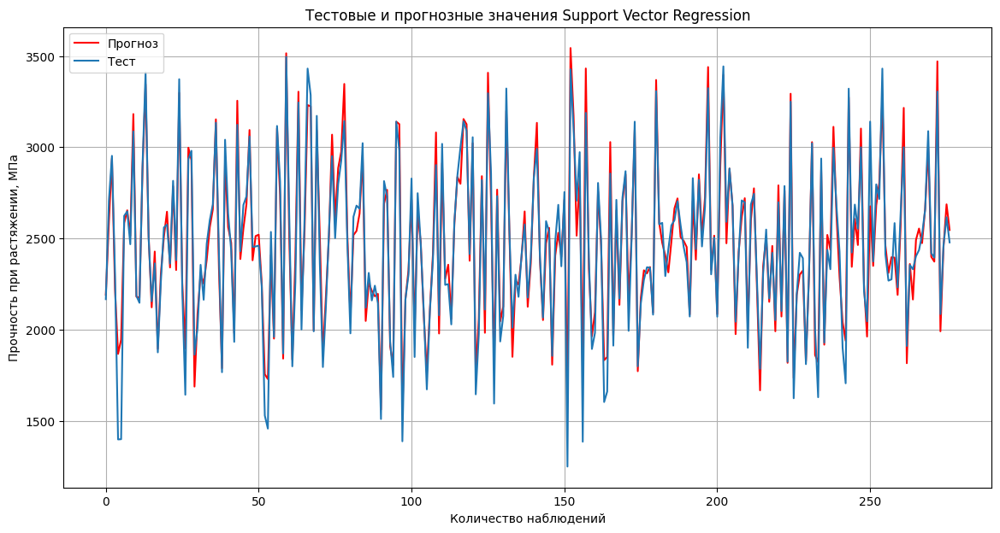

In [65]:
plt.figure(figsize = (14,7))
plt.title("Тестовые и прогнозные значения Support Vector Regression")
plt.plot(y_pred_svr, label = "Прогноз", color = "red")
plt.plot(y_test.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

In [66]:
# Имортируем библиотеки
from sklearn.ensemble import RandomForestRegressor

# Метод слуйчайный лес
rfr = RandomForestRegressor(n_estimators=15, max_depth=7, random_state=33)

#обучаем модель
rfr.fit(X_train, y_train.values)

#вычисляем коэффициент детерминации
y_pred_forest = rfr.predict(X_test)
mae_rfr = mean_absolute_error(y_pred_forest, y_test)
mse_rfr_elast = mean_squared_error(y_test, y_pred_forest)

# Выводим полученные даные
print('Random Forest Regressor Results Train:')
print("Test score: {:.2f}".format(rfr.score(X_train, y_train))) # Для тренировочной выборки
print('Random Forest Regressor Results:')
print('RF_MAE: ', round(mean_absolute_error(y_test, y_pred_forest)))
print('RF_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test, y_pred_forest)))
print('RF_MSE: {:.2f}'.format(mse_rfr_elast))
print("RF_RMSE: {:.2f}".format (np.sqrt(mse_rfr_elast)))
print("Test score: {:.2f}".format(rfr.score(X_test, y_test))) # Для тестовой выборки

Random Forest Regressor Results Train:
Test score: 0.98
Random Forest Regressor Results:
RF_MAE:  77
RF_MAPE: 0.03
RF_MSE: 9505.97
RF_RMSE: 97.50
Test score: 0.96


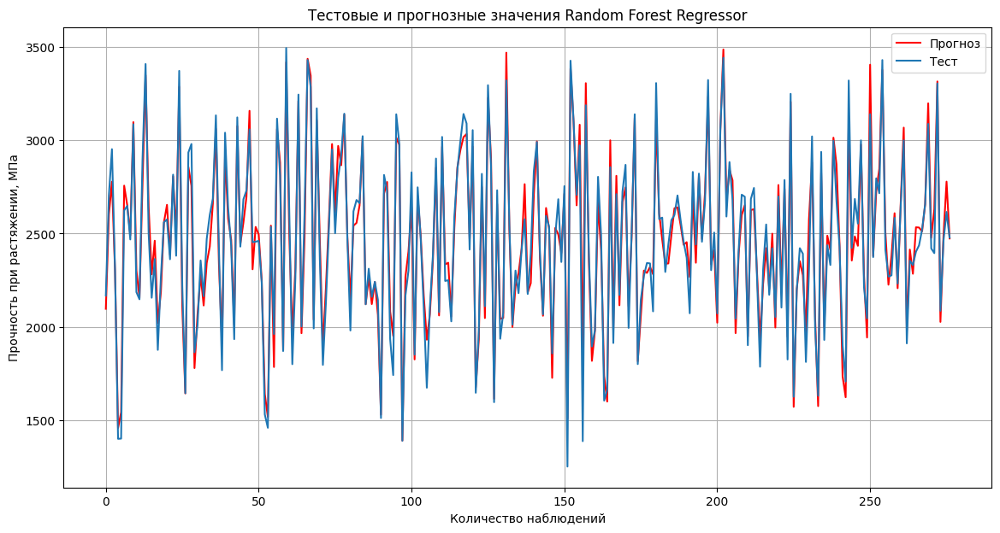

In [67]:
plt.figure(figsize = (14, 7))
plt.title("Тестовые и прогнозные значения Random Forest Regressor")
plt.plot(y_pred_forest, label = "Прогноз", color = "red")
plt.plot(y_test.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

In [68]:
# Импорт нужной библиотеки
from sklearn.linear_model import LinearRegression

# Метод линейная регрессия
lr = LinearRegression()
# Обучаем модель
lr.fit(X_train, y_train)

y_pred_lr = lr.predict(X_test)
mae_lr = mean_absolute_error(y_pred_lr, y_test)
mse_lin_elast = mean_squared_error(y_test, y_pred_lr)

print('Linear Regression Results Train:') # Для тренировочной выборки
print("Test score: {:.2f}".format(lr.score(X_train, y_train)))
print('Linear Regression Results:')    
print('lr_MAE: ', round(mean_absolute_error(y_test, y_pred_lr)))
print('lr_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test, y_pred_lr)))
print('lr_MSE: {:.2f}'.format(mse_lin_elast))
print("lr_RMSE: {:.2f}".format (np.sqrt(mse_lin_elast)))
print("Test score: {:.2f}".format(lr.score(X_test, y_test))) # Для тестовой выборки

Linear Regression Results Train:
Test score: 0.97
Linear Regression Results:
lr_MAE:  62
lr_MAPE: 0.03
lr_MSE: 6149.31
lr_RMSE: 78.42
Test score: 0.97


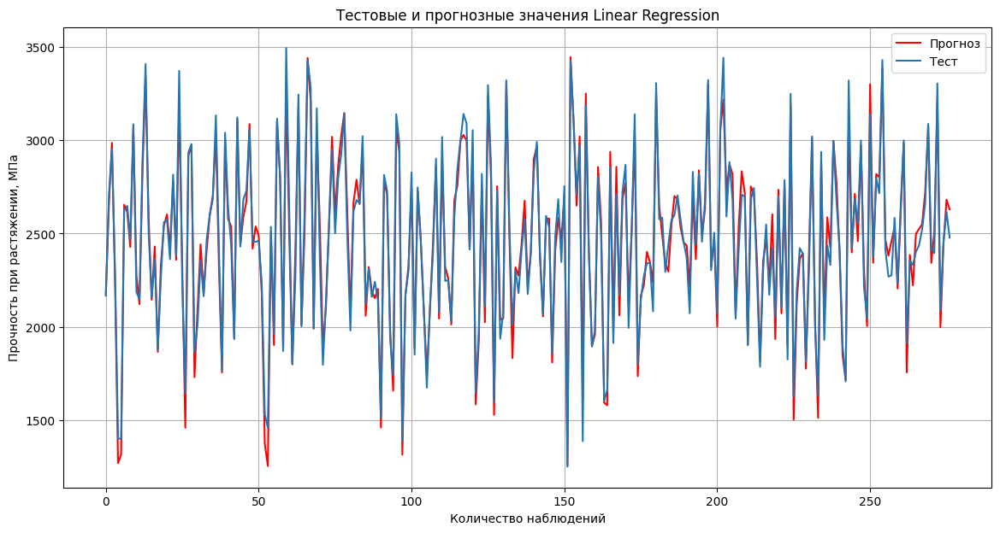

In [69]:
plt.figure(figsize = (14, 7))
plt.title("Тестовые и прогнозные значения Linear Regression")
plt.plot(y_pred_lr, label="Прогноз", color = 'red')
plt.plot(y_test.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

In [70]:
# Импортируем нужную юиюлиотеку
from sklearn.ensemble import GradientBoostingRegressor

# Метод градиетного бустинга
gbr = make_pipeline(StandardScaler(), GradientBoostingRegressor())

gbr.fit(X_train, np.ravel(y_train))

y_pred_gbr = gbr.predict(X_test)
mae_gbr = mean_absolute_error(y_pred_gbr, y_test)
mse_gbr_elast = mean_squared_error(y_test, y_pred_gbr)

print('Gradient Boosting Regressor Results Train:')
print("Test score: {:.2f}".format(gbr.score(X_train, y_train))) # Для тренировочной выборки
print('Gradient Boosting Regressor Results:')
print('GBR_MAE: ', round(mean_absolute_error(y_test, y_pred_gbr)))
print('GBR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test, y_pred_gbr)))
print('GBR_MSE: {:.2f}'.format(mse_gbr_elast))
print("GBR_RMSE: {:.2f}".format (np.sqrt(mse_gbr_elast)))
print("Test score: {:.2f}".format(gbr.score(X_test, y_test)))# Для тестовой выборки

Gradient Boosting Regressor Results Train:
Test score: 0.99
Gradient Boosting Regressor Results:
GBR_MAE:  65
GBR_MAPE: 0.03
GBR_MSE: 6576.18
GBR_RMSE: 81.09
Test score: 0.97


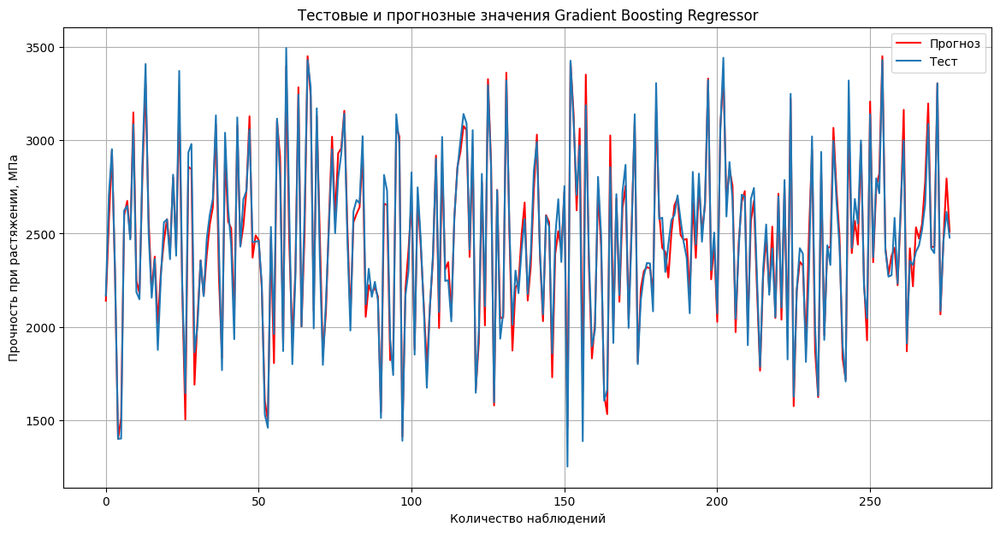

In [71]:
plt.figure(figsize = (14, 7))
plt.title("Тестовые и прогнозные значения Gradient Boosting Regressor")
plt.plot(y_pred_gbr, label = "Прогноз", color = "red")
plt.plot(y_test.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

In [72]:
# Ипортируем нужную библиотеку
from sklearn.neighbors import KNeighborsRegressor

# Метод k-ближайщих соседей
knn = KNeighborsRegressor(n_neighbors=5)

knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)
mae_knr = mean_absolute_error(y_pred_knn, y_test)
mse_knn_elast = mean_squared_error(y_test, y_pred_knn)

print('K Neighbors Regressor  Results Train:')
print("Test score: {:.2f}".format(knn.score(X_train, y_train)))# Для тренировочной выборки
print('K Neighbors Regressor  Results:')
print('KNN_MAE: ', round(mean_absolute_error(y_test, y_pred_knn)))
print('KNN_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test, y_pred_knn)))
print('KNN_MSE: {:.2f}'.format(mse_knn_elast))
print("KNN_RMSE: {:.2f}".format (np.sqrt(mse_knn_elast)))
print("Test score: {:.2f}".format(knn.score(X_test, y_test)))# Для тестовой выборки

K Neighbors Regressor  Results Train:
Test score: 0.94
K Neighbors Regressor  Results:
KNN_MAE:  102
KNN_MAPE: 0.04
KNN_MSE: 16723.93
KNN_RMSE: 129.32
Test score: 0.92


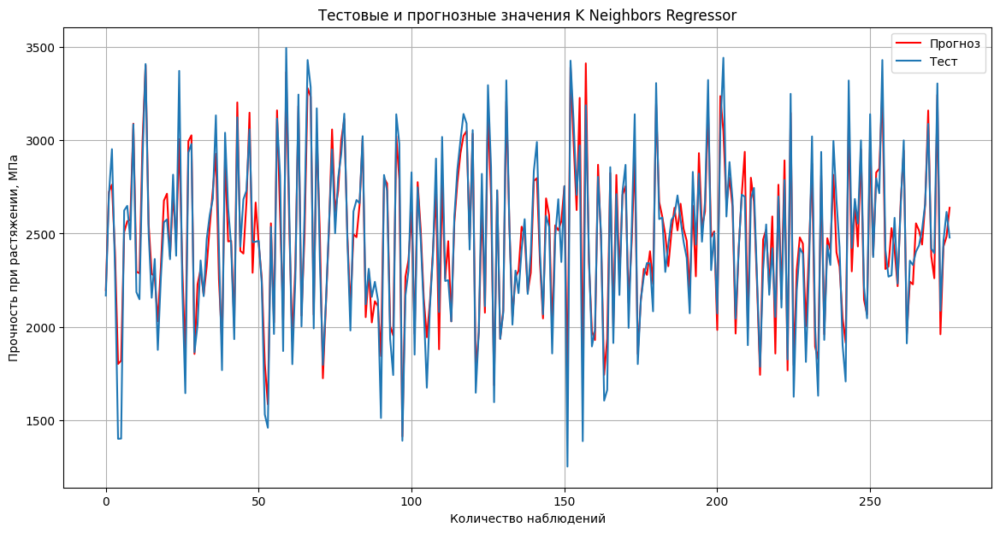

In [73]:
plt.figure(figsize = (14, 7))
plt.title("Тестовые и прогнозные значения K Neighbors Regressor")
plt.plot(y_pred_knn, label = "Прогноз", color = 'red')
plt.plot(y_test.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

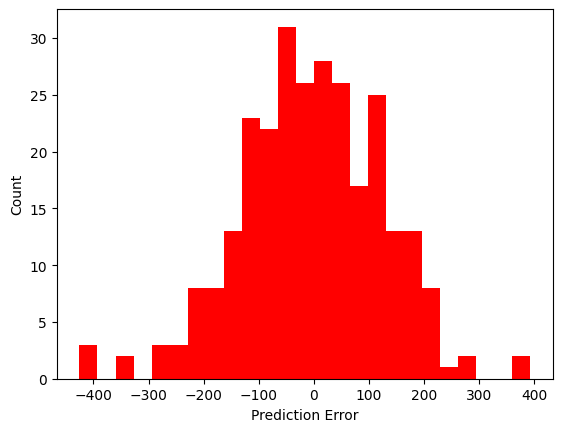

In [74]:
# Визуализация гистораммы распределения
error = y_test - y_pred_knn
plt.hist(error, bins = 25, color = "r")
plt.xlabel('Prediction Error')
_ = plt.ylabel('Count')

In [75]:
# Сравним модели по метрике MAE
mae_df = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 'GradientBoosting', 'KNeighbors'],
          'MAE': [mae_svr, mae_rfr, mae_lr, mae_gbr, mae_knr]} 
mae_df = pd.DataFrame(mae_df)
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,65.021695
4,KNeighbors,102.030259


In [76]:
# Используем модуль GridSearchCV из библиотеки Scikit Learn. Найдем гиперпараметры для нашего датасета

#Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10) 
#для модели случайного леса - Random Forest Regressor
from sklearn.model_selection import GridSearchCV

parametrs = { 'n_estimators': [200, 300], 'max_depth': [9, 15], 
             'max_features': ['sqrt'], 'criterion': ['squared_error'] }
grid = GridSearchCV(estimator = rfr, param_grid = parametrs, cv = 10)
grid.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=RandomForestRegressor(max_depth=7, n_estimators=15,
                                             random_state=33),
             param_grid={'criterion': ['squared_error'], 'max_depth': [9, 15],
                         'max_features': ['sqrt'], 'n_estimators': [200, 300]})

In [77]:
grid.best_params_

{'criterion': 'squared_error',
 'max_depth': 15,
 'max_features': 'sqrt',
 'n_estimators': 300}

In [78]:
# параметры для оптимальной модели
print(grid.best_estimator_)
knr_upr = grid.best_estimator_
print(f'R2-score RFR для прочности при растяжении, МПа: {knr_upr.score(X_test, y_test).round(3)}')

RandomForestRegressor(max_depth=15, max_features='sqrt', n_estimators=300,
                      random_state=33)
R2-score RFR для прочности при растяжении, МПа: 0.943


In [79]:
# Оптимальные гиперпараметры случайного леса
rfr_grid = RandomForestRegressor(n_estimators = 200, criterion = 'squared_error', 
                                 max_depth = 15, max_features = 'log2')

#Обучаем модель
rfr_grid.fit(X_train, y_train)
predictions_rfr_grid = rfr_grid.predict(X_test)

#Оцениваем точность на тестовом наборе
mae_rfr_grid = mean_absolute_error(predictions_rfr_grid, y_test)
mae_rfr_grid

89.03857869550748

In [80]:
# Поиск гиперпарамтров
new_row_in_mae_df = {'Регрессор': 'RandomForest_GridSearchCV', 'MAE': [mae_rfr_grid]} 
new_row_in_mae_df=pd.DataFrame(new_row_in_mae_df)
mae_df={'Регрессор': 'RandomForest_GridSearchCV', 'MAE': mae_rfr_grid}
mae_df=pd.concat([new_row_in_mae_df, pd.DataFrame.from_records([new_row_in_mae_df])], ignore_index=True)
mae_df

,Регрессор,MAE,0,1
0,RandomForest_GridSearchCV,89.038579,NaN,NaN
1,NaN,NaN,Регрессор,MAE


In [81]:
# Объединение для оценки лучшей модели
mae_df = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 'GradientBoosting', 'KNeighbors', 'RandomForest_GridSearchCV'], 
          'MAE': [mae_svr, mae_rfr, mae_lr, mae_gbr, mae_knr, mae_rfr_grid]} 
mae_df = pd.DataFrame(mae_df)
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,65.021695
4,KNeighbors,102.030259
5,RandomForest_GridSearchCV,89.038579


In [82]:
# Проведем поиск по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10),
# для метода К ближайших соседей - K Neighbors Regressor
knn = KNeighborsRegressor()
knn_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']}

#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs = GridSearchCV(knn, knn_params, cv = 10, verbose = 1, n_jobs =-1, scoring = 'r2')
gs.fit(X_train, y_train)
knn_3 = gs.best_estimator_
gs.best_params_

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


{'algorithm': 'auto', 'n_neighbors': 7, 'weights': 'distance'}

In [83]:
# Выводим гиперпарамтры для оптимальной модели
print(gs.best_estimator_)
gs1 = gs.best_estimator_
print(f'R2-score KNR для прочности при растяжении, МПа: {gs1.score(X_test, y_test).round(3)}')

KNeighborsRegressor(n_neighbors=7, weights='distance')
R2-score KNR для прочности при растяжении, МПа: 0.923


In [84]:
# Подставим оптимальные гиперпараметры в нашу модель метода к ближайших соседей
knn_grid = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 7, weights = 'distance')

#Обучаем модель
knn_grid.fit(X_train, y_train)
predictions_knn_grid = knn_grid.predict(X_test)

#Оцениваем точность на тестовом наборе
mae_knn_grid = mean_absolute_error(predictions_knn_grid, y_test)
mae_knn_grid

99.28169380035469

In [85]:
new_row_in_mae_df = {'Регрессор': 'KNeighbors_GridSearchCV', 'MAE': [mae_knn_grid]} 
new_row_in_mae_df=pd.DataFrame(new_row_in_mae_df)
mae_df={'Регрессор': 'KNeighbors_GridSearchCV', 'MAE': mae_knn_grid}
mae_df=pd.concat([new_row_in_mae_df, pd.DataFrame.from_records([new_row_in_mae_df])], ignore_index=True)
mae_df

,Регрессор,MAE,0,1
0,KNeighbors_GridSearchCV,99.281694,NaN,NaN
1,NaN,NaN,Регрессор,MAE


In [86]:
mae_df = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 'GradientBoosting', 'KNeighbors', 'RandomForest_GridSearchCV', 'KNeighbors_GridSearchCV'],
          'MAE': [mae_svr, mae_rfr, mae_lr, mae_gbr, mae_knr, mae_rfr_grid, mae_knn_grid]} 
mae_df = pd.DataFrame(mae_df)
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,65.021695
4,KNeighbors,102.030259
5,RandomForest_GridSearchCV,89.038579
6,KNeighbors_GridSearchCV,99.281694


In [87]:
# Выведем лучшие парамеры и значения
pipe = Pipeline([('preprocessing', StandardScaler()), ('regressor', SVR())])
param_grid = [
{'regressor': [SVR()], 'preprocessing': [StandardScaler(), MinMaxScaler(), None],
'regressor__gamma': [0.001, 0.01, 0.1, 1, 10, 100],
'regressor__C': [0.001, 0.01, 0.1, 1, 10, 100]},    
{'regressor': [RandomForestRegressor(n_estimators = 100)],
'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},   
{'regressor': [LinearRegression()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [GradientBoostingRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},    
{'regressor': [KNeighborsRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},]

grid = GridSearchCV(pipe, param_grid, cv = 10)
grid.fit(X_train, np.ravel(y_train))

print("Наилучшие параметры:{}".format(grid.best_params_))
print("Наилучшее значение правильности перекрестной проверки: {:.2f}".format(grid.best_score_))
print("Правильность на тестовом наборе: {:.2f}".format(grid.score(X_test, y_test)))

Наилучшие параметры:{'preprocessing': MinMaxScaler(), 'regressor': LinearRegression()}
Наилучшее значение правильности перекрестной проверки: 0.97
Правильность на тестовом наборе: 0.97


In [88]:
print("Наилучшая модель:{}".format(grid.best_estimator_))

Наилучшая модель:Pipeline(steps=[('preprocessing', MinMaxScaler()),
                ('regressor', LinearRegression())])


#### Прогноз модуль упрогости при растяжении, ГПа

In [89]:
# Разбиваем на тестовую и тренировочную выборку
normalizer = Normalizer()
res = normalizer.fit_transform(df_n)
df_norma = pd.DataFrame(res, columns = df_n.columns)

In [90]:
X_2 = df_norma.loc[:, df_norma.columns != 'Модуль упругости при растяжении, ГПа']
y_2 = df_n[['Модуль упругости при растяжении, ГПа']]

In [91]:
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, test_size = 0.3, random_state = 42)

In [92]:
# Проверим правильность разбивки
df_norma.shape[0] - X_train_2.shape[0] - X_test_2.shape[0]

0

In [93]:
X_train_2 

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
481,0.000528,0.589066,0.132149,0.020997,0.006254,0.071450,0.186083,0.767682,0.073037,0.000291,0.002285,0.015563
650,0.000430,0.617300,0.232509,0.027252,0.007346,0.075579,0.081347,0.739980,0.056839,0.000308,0.001350,0.018310
483,0.000580,0.585434,0.170519,0.043402,0.007074,0.096550,0.132807,0.772505,0.041487,0.000295,0.002249,0.018929
355,0.000911,0.545896,0.306130,0.024469,0.006610,0.070488,0.159918,0.757679,0.050148,0.000000,0.001774,0.012540
850,0.000573,0.595720,0.263992,0.034166,0.007519,0.089582,0.095597,0.740762,0.086336,0.000322,0.002765,0.017180
...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.001562,0.677286,0.117475,0.028472,0.007156,0.109875,0.012321,0.711398,0.084729,0.000000,0.002699,0.020351
270,0.000952,0.599480,0.202903,0.032920,0.005972,0.090299,0.313487,0.698126,0.062301,0.000000,0.002320,0.015069
860,0.000628,0.535089,0.330843,0.022894,0.006773,0.071159,0.081861,0.765929,0.067091,0.000278,0.001456,0.016386
435,0.000897,0.618519,0.333792,0.031409,0.007491,0.079884,0.087151,0.698192,0.049640,0.000000,0.000217,0.024992


In [94]:
X_test_2

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
319,0.000692,0.664558,0.141916,0.020711,0.007910,0.082145,0.106365,0.715500,0.082796,0.000000,0.003208,0.017396
377,0.001173,0.576172,0.216459,0.037888,0.006397,0.081645,0.021152,0.779434,0.064516,0.000000,0.002127,0.020002
538,0.000444,0.569096,0.008521,0.027481,0.005247,0.065488,0.185712,0.796049,0.046373,0.000270,0.001580,0.016685
296,0.001040,0.620524,0.221966,0.041976,0.006638,0.100387,0.222795,0.706823,0.061189,0.000000,0.003124,0.017666
531,0.001501,0.781238,0.143303,0.031485,0.010887,0.131189,0.003794,0.586813,0.067324,0.000419,0.004305,0.030927
...,...,...,...,...,...,...,...,...,...,...,...,...
420,0.000596,0.487256,0.252105,0.025358,0.004424,0.059838,0.180135,0.811978,0.049206,0.000000,0.001360,0.017152
133,0.000618,0.679845,0.222797,0.037581,0.006965,0.110154,0.120118,0.672247,0.085461,0.000000,0.001301,0.019443
490,0.000873,0.576655,0.350673,0.034912,0.006567,0.066107,0.158291,0.713540,0.061990,0.000290,0.003204,0.018467
558,0.000718,0.536984,0.407982,0.033462,0.006701,0.090992,0.146204,0.716174,0.030460,0.000274,0.001091,0.012710


In [95]:
y_train_2

,"Модуль упругости при растяжении, ГПа"
552,69.573625
735,80.691499
554,71.887367
403,68.314525
948,72.997468
...,...
120,74.519119
306,70.325533
959,77.995289
497,70.199234


In [96]:
y_test_2

,"Модуль упругости при растяжении, ГПа"
360,71.758909
427,77.238628
611,71.416004
336,72.509332
604,73.006935
...,...
479,71.331364
149,72.680026
561,75.187942
632,71.531521


In [97]:
# Сравнение результатов предсказаний с моделью, выдающей среднее значение по тестовой выборке
def mean_model(y_test_2):
    return [np.mean(y_test_2) for _ in range(len(y_test_2))]
y_2_pred_mean = mean_model(y_test_2)

In [98]:
# Метод опорных вектров
svr2 = make_pipeline(StandardScaler(), SVR(kernel = 'rbf', C = 500.0, epsilon = 1.0))

#обучаем модель
svr2.fit(X_train_2, np.ravel(y_train_2))

#вычисляем коэффициент детерминации
y_pred_svr2 = svr2.predict(X_test_2)
mae_svr2 = mean_absolute_error(y_pred_svr2, y_test_2)
mse_svr_elast2 = mean_squared_error(y_test_2, y_pred_svr2)

print('Support Vector Regression Results Train:') 
print("Test score: {:.2f}".format(svr2.score(X_train_2, y_train_2))) # Для тренировочной выборки
print('Support Vector Regression Results:')
print('SVR_MAE:', round(mean_absolute_error(y_test_2, y_pred_svr2)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_svr2)))
print('SVR_MSE: {:.2f}'.format(mse_svr_elast2))
print("SVR_RMSE: {:.2f}".format (np.sqrt(mse_svr_elast2)))
print("Test score: {:.2f}".format(svr2.score(X_test_2, y_test_2))) # Для тестовой выборки

Support Vector Regression Results Train:
Test score: 0.90
Support Vector Regression Results:
SVR_MAE: 3
SVR_MAPE: 0.05
SVR_MSE: 19.21
SVR_RMSE: 4.38
Test score: -0.94


In [99]:
# Результаты модели выдающей среднее значение
mse_lin_elast2_mean = mean_squared_error(y_test_2, y_2_pred_mean)
print("MAE for mean target: ", mean_absolute_error(y_test_2, y_2_pred_mean))
print("MSE for mean target: ", mse_lin_elast2_mean)
print("RMSE for mean target: ", np.sqrt(mse_lin_elast2_mean))

MAE for mean target:  2.5784995357561793
MSE for mean target:  9.910360742106828
RMSE for mean target:  3.148072543971442


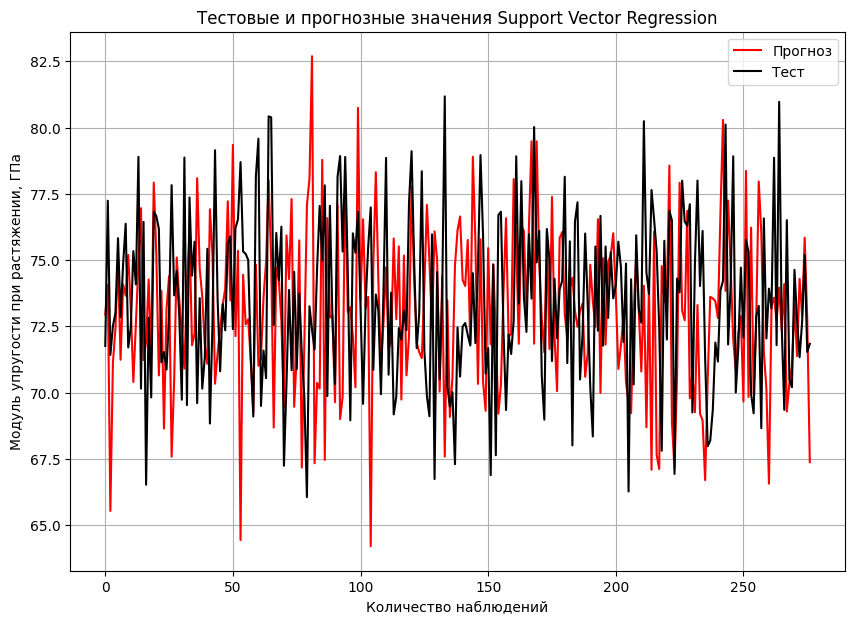

In [100]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Support Vector Regression")
plt.plot(y_pred_svr2, label = "Прогноз", color = "red")
plt.plot(y_test_2.values, label = "Тест", color='black')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True)

In [101]:
# Метод случайный лес
rfr2 = RandomForestRegressor(n_estimators = 15,max_depth = 7, random_state = 33)

rfr2.fit(X_train_2, y_train_2.values)

y2_pred_forest = rfr2.predict(X_test_2)
mae_rfr2 = mean_absolute_error(y2_pred_forest, y_test_2)
mse_rfr_elast2 = mean_squared_error(y_test_2, y2_pred_forest)

print('Random Forest Regressor Results Train:')
print("Test score: {:.2f}".format(rfr2.score(X_train_2, y_train_2))) # Для тренировочной выборки
print('Random Forest Regressor Results:')
print('RF_MAE: ', round(mean_absolute_error(y_test_2, y2_pred_forest)))
print('RF_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y2_pred_forest)))
print('RF_MSE: {:.2f}'.format(mse_rfr_elast2))
print("RF_RMSE: {:.2f}".format (np.sqrt(mse_rfr_elast2)))
print("Test score: {:.2f}".format(rfr2.score(X_test_2, y_test_2))) # Для тестовой выборки

Random Forest Regressor Results Train:
Test score: 0.43
Random Forest Regressor Results:
RF_MAE:  3
RF_MAPE: 0.04
RF_MSE: 10.26
RF_RMSE: 3.20
Test score: -0.04


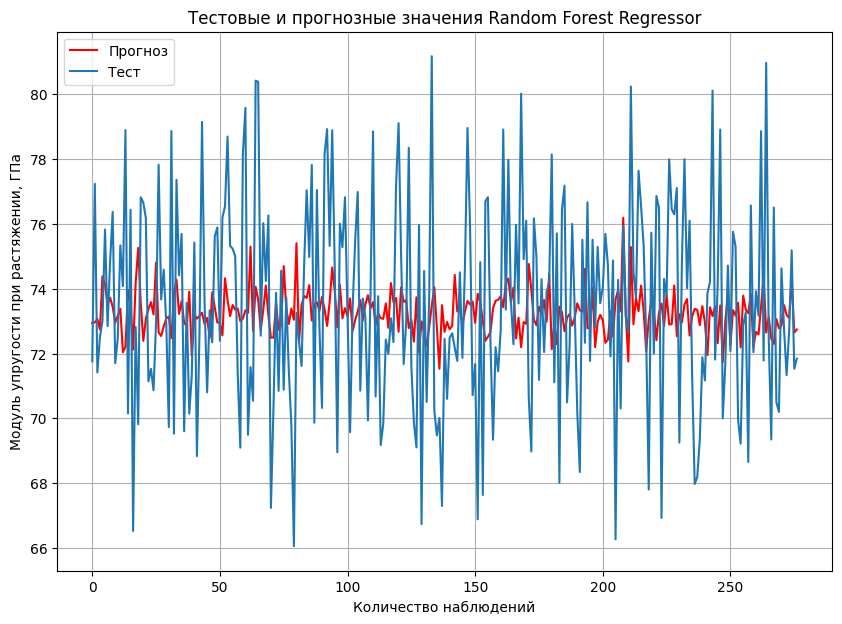

In [102]:
plt.figure(figsize=(10, 7))
plt.title("Тестовые и прогнозные значения Random Forest Regressor")
plt.plot(y2_pred_forest, label = "Прогноз", color = "red")
plt.plot(y_test_2.values, label = "Тест", )
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True)

In [103]:
# Метод линейной регрессии
lr2 = LinearRegression()

lr2.fit(X_train_2, y_train_2)

y_pred_lr2 = lr2.predict(X_test_2)
mae_lr2 = mean_absolute_error(y_pred_lr2, y_test_2)
mse_lin_elast2 = mean_squared_error(y_test_2, y_pred_lr2)

print('Linear Regression Results Train:') # Для тренировочной выборки
print("Test score: {:.2f}".format(lr2.score(X_train_2, y_train_2)))
print('Linear Regression Results:')    
print('lr_MAE: ', round(mean_absolute_error(y_test_2, y_pred_lr2)))
print('lr_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_lr2)))
print('lr_MSE: {:.2f}'.format(mse_lin_elast2))
print("lr_RMSE: {:.2f}".format (np.sqrt(mse_lin_elast2)))
print("Test score: {:.2f}".format(lr2.score(X_test_2, y_test_2))) # Для тестовой выборки

Linear Regression Results Train:
Test score: 0.02
Linear Regression Results:
lr_MAE:  3
lr_MAPE: 0.04
lr_MSE: 10.16
lr_RMSE: 3.19
Test score: -0.03


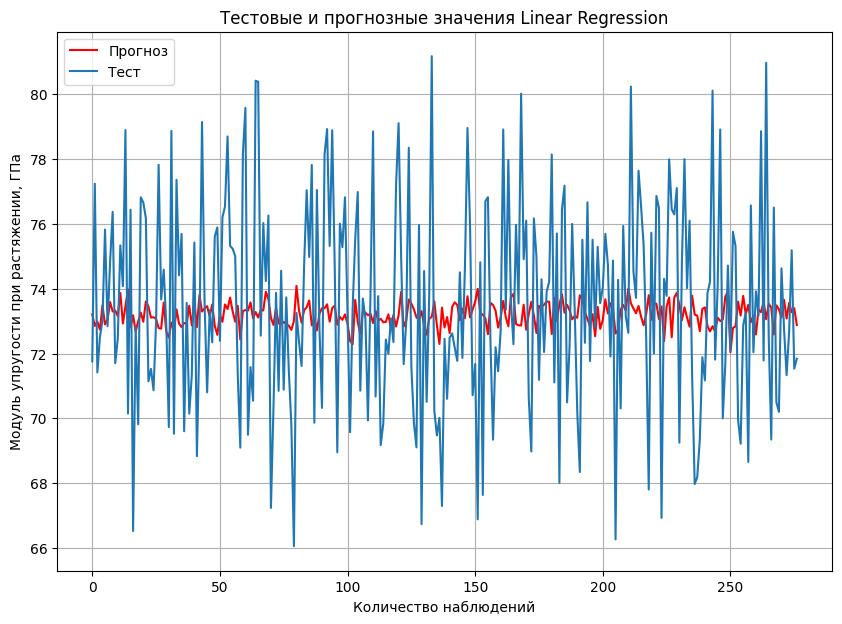

In [104]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Linear Regression")
plt.plot(y_pred_lr2, label = "Прогноз", color = 'red')
plt.plot(y_test_2.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True)

In [105]:
# Метод градиентного бустинга
gbr2 = make_pipeline(StandardScaler(), GradientBoostingRegressor())

gbr2.fit(X_train_2, np.ravel(y_train_2))

y_pred_gbr2 = gbr2.predict(X_test_2)
mae_gbr2 = mean_absolute_error(y_pred_gbr2, y_test_2)
mse_gbr_elast2 = mean_squared_error(y_test_2, y_pred_gbr2)

print('Gradient Boosting Regressor Results Train:')
print("Test score: {:.2f}".format(gbr2.score(X_train_2, y_train_2))) # Скор для тренировочной выборки
print('Gradient Boosting Regressor Results:')
print('GBR_MAE: ', round(mean_absolute_error(y_test_2, y_pred_gbr2)))
print('GBR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_gbr2)))
print('GBR_MSE: {:.2f}'.format(mse_gbr_elast2))
print("GBR_RMSE: {:.2f}".format (np.sqrt(mse_gbr_elast2)))
print("Test score: {:.2f}".format(gbr2.score(X_test_2, y_test_2)))# Скор для тестовой выборки

Gradient Boosting Regressor Results Train:
Test score: 0.52
Gradient Boosting Regressor Results:
GBR_MAE:  3
GBR_MAPE: 0.04
GBR_MSE: 11.11
GBR_RMSE: 3.33
Test score: -0.12


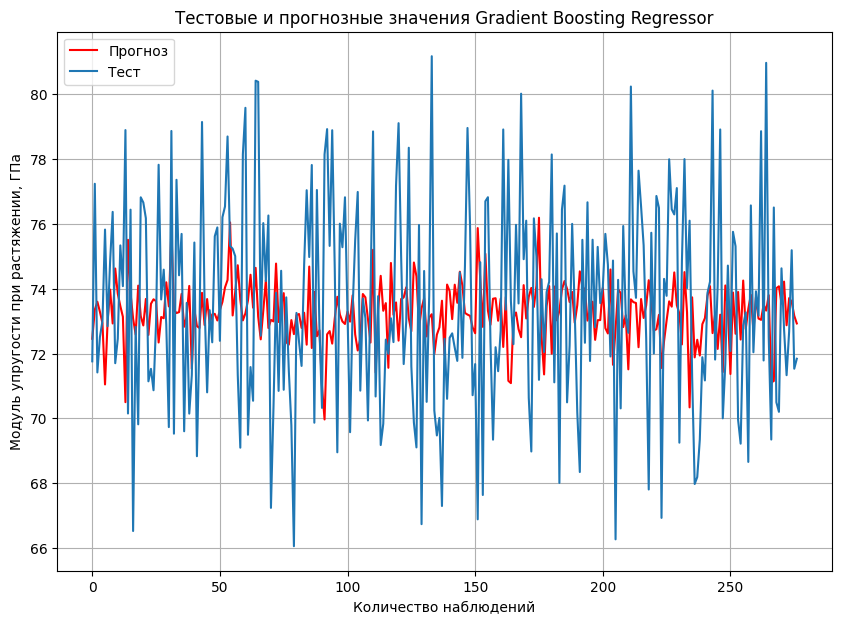

In [106]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Gradient Boosting Regressor")
plt.plot(y_pred_gbr2, label = "Прогноз", color = "red")
plt.plot(y_test_2.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True)

In [107]:
# Метод k-ближайших соседей
knn2 = KNeighborsRegressor(n_neighbors=5)

knn2.fit(X_train_2, y_train_2)

y_pred_knn2 = knn2.predict(X_test_2)
mae_knr2 = mean_absolute_error(y_pred_knn2, y_test_2)
mse_knn_elast2 = mean_squared_error(y_test_2, y_pred_knn2)

print('K Neighbors Regressor  Results Train:')
print("Test score: {:.2f}".format(knn2.score(X_train_2, y_train_2)))# Для тренировочной выборки
print('K Neighbors Regressor  Results:')
print('KNN_MAE: ', round(mean_absolute_error(y_test_2, y_pred_knn2)))
print('KNN_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_knn2)))
print('KNN_MSE: {:.2f}'.format(mse_knn_elast2))
print("KNN_RMSE: {:.2f}".format (np.sqrt(mse_knn_elast2)))
print("Test score: {:.2f}".format(knn2.score(X_test_2, y_test_2)))# Для тестовой выборки

K Neighbors Regressor  Results Train:
Test score: 0.16
K Neighbors Regressor  Results:
KNN_MAE:  3
KNN_MAPE: 0.04
KNN_MSE: 11.57
KNN_RMSE: 3.40
Test score: -0.17


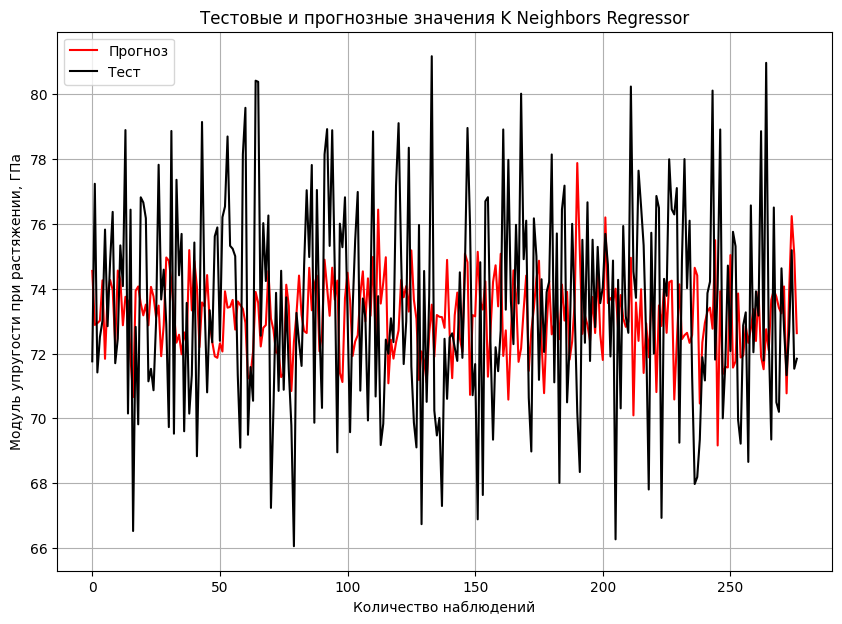

In [108]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения K Neighbors Regressor")
plt.plot(y_pred_knn2, label = "Прогноз", color = 'red')
plt.plot(y_test_2.values, label = "Тест", color = 'black')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True)

In [109]:
# Сравним наши модели по метрике МАЕ
mae_df2 = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 'GradientBoosting', 'KNeighbors'], 'MAE': [mae_svr2, mae_rfr2, mae_lr2, mae_gbr2, mae_knr2]} 
mae_df2 = pd.DataFrame(mae_df2)
mae_df2

,Регрессор,MAE
0,Support Vector,3.447804
1,RandomForest,2.612433
2,Linear Regression,2.609341
3,GradientBoosting,2.664305
4,KNeighbors,2.773522


In [110]:
# Поиск по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), 
# для модели случайного леса - Random Forest Regressor
parametrs = { 'n_estimators': [200, 300], 'max_depth': [9, 15],
              'max_features': ['log2'], 'criterion': ['squared_error'] }
grid21 = GridSearchCV(estimator = rfr2, param_grid  = parametrs, cv=10)
grid21.fit(X_train_2, y_train_2)

GridSearchCV(cv=10,
             estimator=RandomForestRegressor(max_depth=7, n_estimators=15,
                                             random_state=33),
             param_grid={'criterion': ['squared_error'], 'max_depth': [9, 15],
                         'max_features': ['log2'], 'n_estimators': [200, 300]})

In [111]:
grid21.best_params_

{'criterion': 'squared_error',
 'max_depth': 15,
 'max_features': 'log2',
 'n_estimators': 200}

In [112]:
# Выводим гиперпараметры для оптимальной модели
print(grid21.best_estimator_)
knr_u = grid21.best_estimator_
print(f'R2-score RFR для модуля упругости при растяжении: {knr_u.score(X_test_2, y_test_2).round(3)}')

RandomForestRegressor(max_depth=15, max_features='log2', n_estimators=200,
                      random_state=33)
R2-score RFR для модуля упругости при растяжении: -0.038


In [113]:
# Подставим оптимальные гиперпараметры в нашу модель случайного леса
rfr21_grid = RandomForestRegressor(n_estimators=200, criterion='squared_error', max_depth=15, max_features='sqrt')

#Обучаем модель
rfr21_grid.fit(X_train_2, y_train_2)
predictions_rfr21_grid = rfr21_grid.predict(X_test_2)

#Оцениваем точность на тестовом наборе
mae_rfr21_grid = mean_absolute_error(predictions_rfr21_grid, y_test_2)
mae_rfr21_grid

2.621348334598711

In [114]:
new_row_in_mae_df = {'Регрессор': 'RandomForest1_GridSearchCV', 'MAE': [mae_rfr21_grid]}
new_row_in_mae_df=pd.DataFrame(new_row_in_mae_df)
mae_df2={'Регрессор': 'RandomForest1_GridSearchCV', 'MAE': mae_rfr21_grid}
mae_df2=pd.concat([new_row_in_mae_df, pd.DataFrame.from_records([new_row_in_mae_df])], ignore_index=True)
mae_df2

,Регрессор,MAE,0,1
0,RandomForest1_GridSearchCV,2.621348,NaN,NaN
1,NaN,NaN,Регрессор,MAE


In [115]:
mae_df2 = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 'GradientBoosting', 'KNeighbors', 'RandomForest1_GridSearchCV'], 'MAE': [mae_svr2, mae_rfr2, mae_lr2, mae_gbr2, mae_knr2, mae_rfr21_grid]} 
mae_df2 = pd.DataFrame(mae_df2)
mae_df2

,Регрессор,MAE
0,Support Vector,3.447804
1,RandomForest,2.612433
2,Linear Regression,2.609341
3,GradientBoosting,2.664305
4,KNeighbors,2.773522
5,RandomForest1_GridSearchCV,2.621348


In [116]:
# Поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), 
# для метод К ближайших соседей - K Neighbors Regressor
knn21 = KNeighborsRegressor()
knn21_params = {'n_neighbors' : range(1, 301, 2),  'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']}

# Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs21 = GridSearchCV(knn21, knn21_params, cv = 10, verbose = 1, n_jobs=-1, scoring = 'r2')
gs21.fit(X_train_2, y_train_2)
knn_21 = gs21.best_estimator_
gs21.best_params_

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


{'algorithm': 'auto', 'n_neighbors': 113, 'weights': 'uniform'}

In [117]:
# Выводим гиперпараметры для оптимальной модели
print(gs21.best_estimator_)
gs121 = gs21.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {gs121.score(X_test_2, y_test_2).round(3)}')

KNeighborsRegressor(n_neighbors=113)
R2-score KNR для модуля упругости при растяжении: -0.037


In [118]:
# Подставим оптимальные гиперпараметры в нашу модель метода к ближайших соседей
knn21_grid = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 7, weights = 'distance')

#Обучаем модель
knn21_grid.fit(X_train_2, y_train_2)
predictions_knn21_grid = knn21_grid.predict(X_test_2)

#Оцениваем точность на тестовом наборе
mae_knn21_grid = mean_absolute_error(predictions_knn21_grid, y_test_2)
mae_knn21_grid

2.7577808199083345

In [119]:
new_row_in_mae_df = {'Регрессор': 'KNeighbors1_GridSearchCV', 'MAE': [mae_knn21_grid]}
new_row_in_mae_df=pd.DataFrame(new_row_in_mae_df)
mae_df2={'Регрессор': 'KNeighbors1_GridSearchCV', 'MAE': mae_knn21_grid}
mae_df2=pd.concat([new_row_in_mae_df, pd.DataFrame.from_records([new_row_in_mae_df])], ignore_index=True)
mae_df2

,Регрессор,MAE,0,1
0,KNeighbors1_GridSearchCV,2.757781,NaN,NaN
1,NaN,NaN,Регрессор,MAE


In [120]:
mae_df2 = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 'GradientBoosting', 'KNeighbors', 'RandomForest1_GridSearchCV', 'KNeighbors1_GridSearchCV'], 
           'MAE': [mae_svr2, mae_rfr2, mae_lr2, mae_gbr2, mae_knr2, mae_rfr21_grid, mae_knn21_grid]} 
mae_df2 = pd.DataFrame(mae_df2)
mae_df2

,Регрессор,MAE
0,Support Vector,3.447804
1,RandomForest,2.612433
2,Linear Regression,2.609341
3,GradientBoosting,2.664305
4,KNeighbors,2.773522
5,RandomForest1_GridSearchCV,2.621348
6,KNeighbors1_GridSearchCV,2.757781


In [121]:
mae_df=mae_df2
mae_df

,Регрессор,MAE
0,Support Vector,3.447804
1,RandomForest,2.612433
2,Linear Regression,2.609341
3,GradientBoosting,2.664305
4,KNeighbors,2.773522
5,RandomForest1_GridSearchCV,2.621348
6,KNeighbors1_GridSearchCV,2.757781


In [122]:
pipe2 = Pipeline([('preprocessing', StandardScaler()), ('regressor', SVR())])
param_grid2 = [
{'regressor': [SVR()], 'preprocessing': [StandardScaler(), MinMaxScaler(), None],
'regressor__gamma': [0.001, 0.01, 0.1, 1, 10, 100],
'regressor__C': [0.001, 0.01, 0.1, 1, 10, 100]},    
{'regressor': [RandomForestRegressor(n_estimators = 100)],
'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},   
{'regressor': [LinearRegression()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [GradientBoostingRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},    
{'regressor': [KNeighborsRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},]

grid2 = GridSearchCV(pipe2, param_grid2, cv=10)
grid2.fit(X_train_2, np.ravel(y_train_2))
print("Наилучшие параметры:\n{}\n".format(grid2.best_params_))
print("Наилучшее значение правильности перекрестной проверки: {:.2f}".format(grid2.best_score_))
print("Правильность на тестовом наборе: {:.2f}".format(grid2.score(X_test_2, y_test_2)))

Наилучшие параметры:
{'preprocessing': StandardScaler(), 'regressor': SVR(), 'regressor__C': 1, 'regressor__gamma': 1}

Наилучшее значение правильности перекрестной проверки: -0.00
Правильность на тестовом наборе: -0.01


In [123]:
print("Наилучшая модель:{}".format(grid2.best_estimator_))

# После обучения моделей была проведена оценка точности этих моделей на обучающей и тестовых выборках. 
# В качестве параметра оценки модели использовалась средняя абсолютная ошибка (MAE).
# Обе модели даже на тренировочном датасете не смогли обучиться и приблизиться к исходным данным.
# Поэтому ошибка на тестовом датасете выше.

Наилучшая модель:Pipeline(steps=[('preprocessing', StandardScaler()),
                ('regressor', SVR(C=1, gamma=1))])


### 5. Написать нейронную сеть, которая будет рекомендовать соотношение матрица-наполнитель. 

In [125]:
df_n 

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1.0,6.313201,58.261074


In [177]:
df_neir = df_n.reset_index(drop=True)
X = df_neir.drop('Соотношение матрица-наполнитель', axis=1)
y = df_neir['Соотношение матрица-наполнитель']

In [178]:
X

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
1,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
2,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
3,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,60.000000
4,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
917,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1.0,9.076380,47.019770
918,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1.0,10.565614,53.750790
919,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1.0,4.161154,67.629684
920,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1.0,6.313201,58.261074


In [179]:
y

0      1.857143
1      1.857143
2      2.771331
3      2.767918
4      2.569620
         ...   
917    2.271346
918    3.444022
919    3.280604
920    3.705351
921    3.808020
Name: Соотношение матрица-наполнитель, Length: 922, dtype: float64

In [180]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [181]:
print(f'Размер обучающей выборки: {X_train.shape[0]}')
print(f'Размер тестовой выборки: {X_test.shape[0]}')

Размер обучающей выборки: 645
Размер тестовой выборки: 277


In [182]:
from keras.layers import Normalization
neiro = np.array(X_train)
neiro_normalizer = Normalization(input_shape=[12,], axis=None)
neiro_normalizer.adapt(neiro)
neiro

array([[1.98497869e+03, 1.16230294e+03, 1.19143040e+02, ...,
        0.00000000e+00, 1.21787950e+01, 4.57599000e+01],
       [2.10267297e+03, 4.96873650e+02, 9.39094778e+01, ...,
        1.00000000e+00, 8.38231591e+00, 5.33283193e+01],
       [1.95891770e+03, 7.04482015e+02, 1.25074465e+02, ...,
        1.00000000e+00, 4.35870176e+00, 5.48102466e+01],
       ...,
       [1.95387379e+03, 1.10712757e+03, 8.02664972e+01, ...,
        1.00000000e+00, 8.30796396e+00, 5.68802568e+01],
       [2.01265204e+03, 5.97620504e+02, 5.79497801e+01, ...,
        0.00000000e+00, 7.04354373e+00, 5.56620703e+01],
       [1.99615915e+03, 5.25057774e+02, 7.75068825e+01, ...,
        0.00000000e+00, 6.67578034e+00, 7.86232993e+01]])

In [183]:
neiro_normalizer

In [184]:
from keras.layers import Dense
from keras.optimizers import Adam
from keras.models import Sequential
def build_and_compile_model(norm):
    model = Sequential([
      norm,
      Dense(256, activation='relu'),
      Dense(256, activation='relu'),
      Dense(64, activation='linear'), 
      Dense(1)
    ])

    model.compile(loss='mean_squared_error',
                optimizer=Adam(0.0005))
    return model

In [185]:
neiro_model = build_and_compile_model(neiro_normalizer)
neiro_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_5 (Normaliza  (None, 12)                3         
 tion)                                                           
                                                                 
 dense_8 (Dense)             (None, 256)               3328      
                                                                 
 dense_9 (Dense)             (None, 256)               65792     
                                                                 
 dense_10 (Dense)            (None, 64)                16448     
                                                                 
 dense_11 (Dense)            (None, 1)                 65        
                                                                 
Total params: 85636 (334.52 KB)
Trainable params: 85633 (334.50 KB)
Non-trainable params: 3 (16.00 Byte)
_______________

In [186]:
import datetime

In [187]:
%%time
history = neiro_model.fit(
    X_train,
    y_train,
    validation_split=0.2,
    verbose=1, epochs=20)

Epoch 1/20


17/17 [==============================] - 2s 24ms/step - loss: 3.2012 - val_loss: 1.3554
Epoch 2/20
17/17 [==============================] - 0s 6ms/step - loss: 0.9397 - val_loss: 0.8856
Epoch 3/20
17/17 [==============================] - 0s 6ms/step - loss: 0.8309 - val_loss: 0.8372
Epoch 4/20
17/17 [==============================] - 0s 6ms/step - loss: 0.7887 - val_loss: 0.8223
Epoch 5/20
17/17 [==============================] - 0s 6ms/step - loss: 0.7756 - val_loss: 0.8333
Epoch 6/20
17/17 [==============================] - 0s 7ms/step - loss: 0.7832 - val_loss: 0.8707
Epoch 7/20
17/17 [==============================] - 0s 6ms/step - loss: 0.7877 - val_loss: 0.8476
Epoch 8/20
17/17 [==============================] - 0s 7ms/step - loss: 0.7785 - val_loss: 0.8189
Epoch 9/20
17/17 [==============================] - 0s 6ms/step - loss: 0.7838 - val_loss: 0.8428
Epoch 10/20
17/17 [==============================] - 0s 6ms/step - loss: 0.7733 - val_loss: 0.8155
Epoch 11/20
17/17 [==========

In [188]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([0, 2])
    plt.xlabel('Эпоха')
    plt.ylabel('MSE [MPG]')
    plt.legend()
    plt.grid(True)

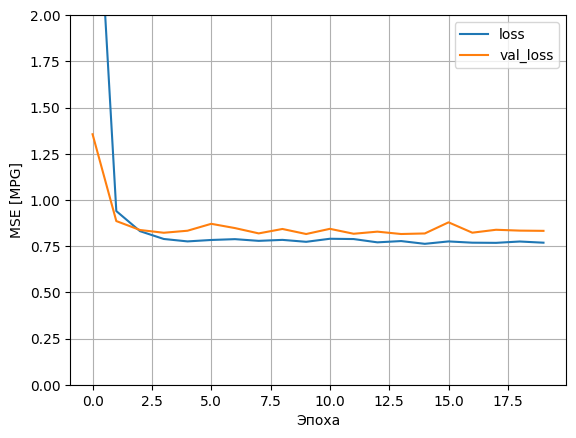

In [189]:
plot_loss(history)

In [190]:
X_test

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
827,1993.662575,102.490025,142.797271,24.154225,354.890074,26.053941,74.553726,2100.602732,211.743890,1.0,6.759424,60.888620
699,1961.001830,664.231176,96.488730,25.152622,279.332298,705.789809,74.733704,2380.258563,245.542317,1.0,7.231542,66.934401
891,1912.873673,535.325944,115.654547,26.605045,264.335483,350.233827,75.882143,1958.895808,257.193837,1.0,11.443058,54.362588
385,2005.525252,1065.579877,138.137198,18.295398,378.482590,618.409545,70.643900,1703.062546,225.535645,0.0,6.286293,50.709233
154,1999.852104,788.456272,136.710285,20.199541,367.549316,951.144248,72.321161,2427.976067,356.925975,0.0,9.625690,37.350653
...,...,...,...,...,...,...,...,...,...,...,...,...
0,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
721,1964.749492,376.553340,146.098051,20.646568,277.938770,735.086541,79.450448,2805.158519,309.786667,1.0,6.431891,53.806119
66,1929.677531,1143.787113,161.557741,22.725194,303.530090,894.354923,75.321098,1934.316033,131.922189,0.0,4.545925,63.325704
522,2012.771415,535.144341,100.852237,21.333804,267.167753,1142.302815,74.096116,2083.629628,128.208167,1.0,7.678160,58.692189


In [191]:
y_test.head(10)

827    1.862875
699    1.797133
891    3.513742
385    4.200930
154    2.275182
125    3.652004
579    4.088174
764    1.298667
347    2.498733
746    0.986746
Name: Соотношение матрица-наполнитель, dtype: float64

In [192]:
len(y_test)

277

9/9 [==============================] - 0s 3ms/step


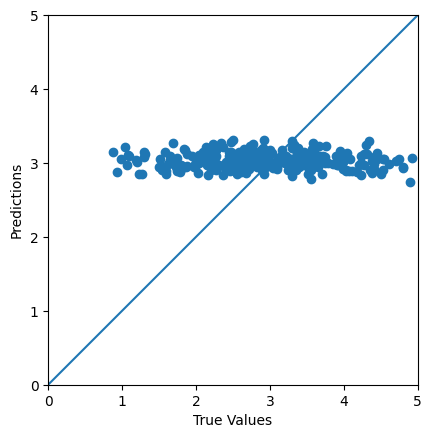

In [193]:
test_predictions = neiro_model.predict(X_test).flatten()

a = plt.axes(aspect='equal')
plt.scatter(y_test, test_predictions)
plt.xlabel('True Values')
plt.ylabel('Predictions')
lims = [0, 5]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

In [194]:
test_predictions

array([2.9397342, 2.974394 , 2.8533947, 2.9775567, 3.0992362, 3.1001675,
       3.052543 , 3.1535416, 3.3071458, 3.0587175, 3.0943663, 3.2813177,
       3.0509856, 2.9142191, 3.133868 , 2.9439929, 3.1008458, 3.0364249,
       3.1431558, 3.2286794, 3.0929549, 3.045748 , 3.0477421, 2.78209  ,
       2.9518678, 3.1724167, 3.0313923, 2.8968608, 2.976141 , 2.9065783,
       2.9932363, 3.1200993, 2.9587193, 3.1214433, 2.9809518, 3.0420313,
       3.0286849, 3.0337803, 2.8550293, 3.1003141, 3.1132462, 3.1451623,
       3.0911689, 3.1470492, 3.154342 , 2.9259682, 3.0814533, 3.050691 ,
       2.9360754, 3.076894 , 2.8908327, 2.8607922, 3.1961462, 3.0201242,
       3.1702392, 3.0865362, 3.0065842, 2.973787 , 2.9810016, 2.995794 ,
       3.0001285, 3.0583804, 2.9516675, 3.1931016, 2.9593108, 3.093681 ,
       3.0138092, 2.944503 , 2.974448 , 3.1332781, 2.9947765, 3.111376 ,
       3.2638757, 3.1032188, 2.9103444, 3.1835973, 3.02336  , 3.0576615,
       3.1274004, 3.0557387, 3.2347918, 2.9396725, 

In [195]:
len(test_predictions)

277

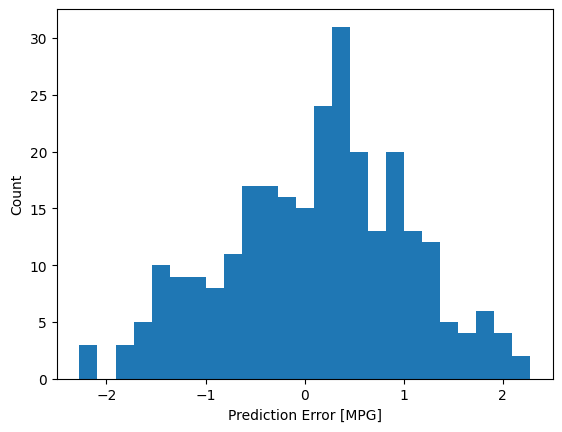

In [196]:
error = test_predictions - y_test
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')

In [197]:
# Сохраним модель
import pickle
lr = LinearRegression()
pickle.dump(lr, open('lr_model.pkl', 'wb'))

In [198]:
model_load=pickle.load(open('lr_model.pkl', 'rb'))

## Заключение.

### Для работы нам были предоставлены реальные данные основанные на реальных производственных задачах Центра НТИ «Цифровое материаловедение: новые материалы и вещества» (структурное подразделение МГТУ им. Н.Э. Баумана). В данной работе было сделан анализ; построено множество разнообразных графиков; осуществлено разбиение данных на обучающую и тестовую выборки с использованием множества вспомогательных модулей из библиотеки SkLearn, которая во многом облегчила процесс машинного обучения и в целом была очень полезным инструментом в ходе работы над выпускной квалификационной работой. 

### В рамках машинного обучения и поиска гиперпараметров были задействованы несколько алгоритмов: 
- Метод опорных векторов.
- «Случайный лес».
- Линейная регрессия.
- Градиентный бустинг.
- Метод k-ближайших соседей.

### Поиск гиперпараметров осуществлялся при помощи «GridSearch». Представлено сравнение результатов оценок работы алгоритмов, а также различные графики и диаграммы, позволяющие наглядно оценить итоги проведенного обучения. 

### Обучена нейронная сеть.
### Разработано приложение.
## Для изучение данного вопроса нужные более клалифицированные специалисты.